### The AQACF and Fire Alarm projects are supported via NASA's Earth Science Technology Office (ESTO) from the Advanced Information Systems Technology (AIST) Program

# Air Quality Analytics Collaborative Framework (AQACF) API Demonstration

This notebook highlits some of the analytics and visualization capabilities of AQACF with six use cases:
- 2021 Dixie Fire
- 2018 Carr Wildfire
- Los Angeles ports backlog Fall 2021
- Fireworks during 4th of July 2022 in Los Angeles county
- Air Pollution in the Yellow Sea
- 2022 Fire Season in Southeast Asia

## Libraries and Functions

The following libraries are needed to support accessing FireAlarm API. The functions called in this notebook are in the `firealarm_modules` folder.

### Libraries

In [3]:
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

import xml.etree.ElementTree as xmlet
import requests
import pandas as pd
from datetime import datetime, timedelta
from shapely.geometry import box
import numpy as np
from IPython.display import Image
from owslib.util import Authentication
from owslib.wms import WebMapService
from PIL import Image as I
from PIL import ImageDraw, ImageFont

import firealarm_modules.plotting as plotting
import firealarm_modules.firealarm_processing as firealarm_processing

## AQACF DATA Inventory

The base url, https://ideas-digitaltwin.jpl.nasa.gov/nexus, is the entry to access FireAlarm API. In the following code snipet, it is used in conjunction with list endpoint to get a list of datasets.

In [4]:
BASE_URL = 'https://ideas-digitaltwin.jpl.nasa.gov'
NEXUS_URL = f'{BASE_URL}/nexus'
STAC_URL = f'{BASE_URL}/stac-api'

## STAC API

In [8]:
url = f'{STAC_URL}/edge_collections'
print('url\n', url); print()
r = requests.get(url, verify=False).json()

collections = r['collections']
print(len(collections), 'collections found')

url
 https://ideas-digitaltwin.jpl.nasa.gov/stac-api/edge_collections

15 collections found


In [215]:
[c['id'] for c in collections]

['GPM-3IMERGHHR-06-daily-global-precipitationCal',
 'nasa-merra-2-0.5-hourly-global-CDH',
 'nasa-merra-2-0.5-hourly-global-PBLH',
 'nasa-merra-2-0.5-hourly-global-TLML',
 'PWWB-preds-40x40-hourly-LA_County-NO2',
 'PWWB-preds-40x40-hourly-LA_County-PM25',
 'acag-v5gl02-GWRPM25',
 'acag-v5gl02-GWRPM25-monthly',
 'laads-1degx1deg-daily-global_Aerosol_Optical_Thickness_550_Land_Ocean_Mean',
 'laads-1degx1deg-daily-global_Aerosol_Optical_Thickness_550_Land_Ocean_Standard_Deviation',
 'laads-1degx1deg-daily-global_Aerosol_Type_Land_Ocean_Mode',
 'laads-1degx1deg-daily-global_Angstrom_Exponent_Land_Ocean_Mean',
 'wustl-0.1degx0.1deg-daily-ca-SpeciesConc_CH4',
 'wustl-0.1degx0.1deg-daily-ca-SpeciesConc_NO',
 'wustl-0.1degx0.1deg-daily-ca-SpeciesConc_NO2']

In [211]:
NEXUS_URL = 'https://ideas-digitaltwin.jpl.nasa.gov/nexus/'
r = requests.get(f'{NEXUS_URL}/list', verify=False).json()
inv_df = pd.DataFrame(r)[['title', 'iso_start', 'iso_end']].dropna(how='all')
inv_df.sort_values('title')

,title,iso_start,iso_end
0,GLDAS_CLSM10_3H_2_1_global_Qs_acc,2018-10-01T00:00:00+0000,2022-03-01T21:00:00+0000
1,GLDAS_CLSM10_3H_2_1_global_Qsb_acc,2018-10-01T00:00:00+0000,2022-03-01T21:00:00+0000
2,GLDAS_NOAH10_3H_2_1_global_Qs_acc,2018-10-01T00:00:00+0000,2022-03-01T21:00:00+0000
3,GLDAS_NOAH10_3H_2_1_global_Qsb_acc,2018-10-01T00:00:00+0000,2022-03-01T21:00:00+0000
4,GLDAS_VIC10_3H_2_1_global_Qs_acc,2018-10-01T00:00:00+0000,2022-03-01T21:00:00+0000
...,...,...,...
241,wustl-0.1degx0.1deg-daily-ca-SpeciesConc_SO2_D...,1970-01-01T00:00:00+0000,1970-12-01T00:00:00+0000
242,wustl-0.1degx0.1deg-daily-ca-SpeciesConc_SO2_D8,2017-03-01T12:00:00+0000,2018-12-31T12:00:00+0000
243,wustl-0.1degx0.1deg-daily-ca-SpeciesConc_SO2_D...,1970-01-01T00:00:00+0000,1970-12-01T00:00:00+0000
244,wustl-0.1degx0.1deg-daily-ca-SpeciesConc_SO2_D9,2017-03-01T12:00:00+0000,2018-12-31T12:00:00+0000


# Dixie Fire

The 2021 California wildfire season was one of the worst on record with 2,569,386 million acres burned. The 2021 CA wildfire season produces hundreds of fires including the Dixie fire that, at nearly a million acres burned, is the largest single source fire in state history. 
It's estimated that California wildfires emitted 75 million metric tons of carbon dioxide in just three months (June - August 2021).

75 million metric tons of carbon dioxide is equal to:
- 16,310,993 passenger cars driven for a year (Greenhouse Gas - GHG)
- 188,489,840,317 miles driven by an average passenger vehicle (GHG)
- 8,439,293,350 gallons of gasoline consumed (Carbon Dioxide Emissions – CO2)
- 82,896,993 pounds of coal burned (CO2)
- 173,640,855 barrels of oil consumed (CO2)

Relevant Articles:
- https://www.nytimes.com/2021/09/21/climate/wildfire-emissions-climate-change.html 
- https://www.theguardian.com/us-news/2021/dec/25/what-the-numbers-tells-us-about-a-catastrophic-year-of-wildfires 

### Area of Interest

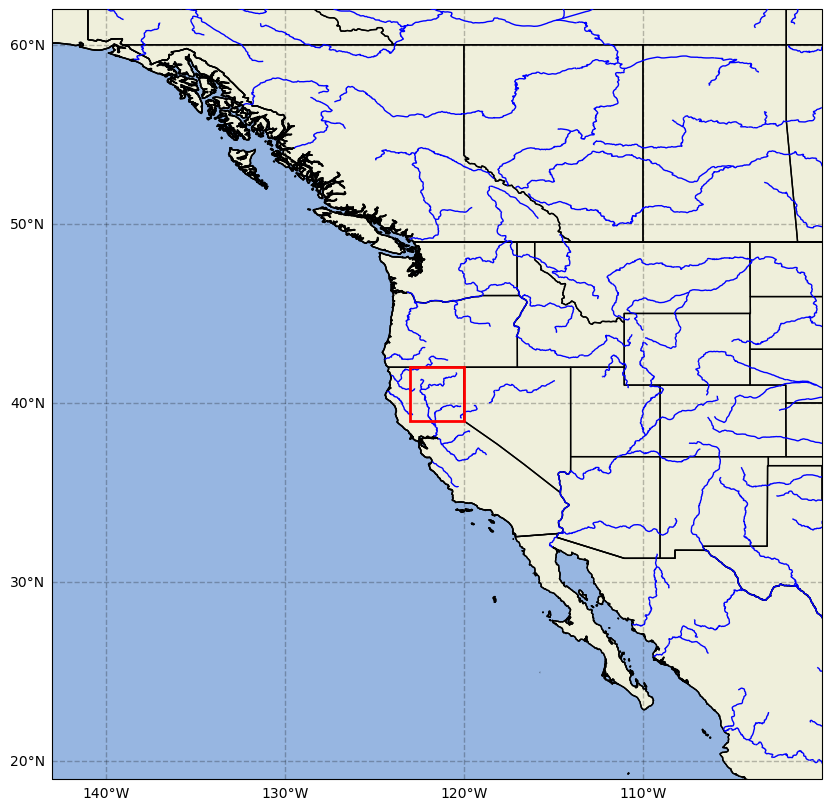

In [118]:
wildfires_bb = {'min_lon': -123, 'max_lon': -120, 'min_lat': 39, 'max_lat': 42}
wildfires_start_time = datetime(2021,7,1)
wildfires_end_time = datetime(2021,10,1)

wildfires_bbox = box(wildfires_bb['min_lon'], wildfires_bb['min_lat'], wildfires_bb['max_lon'], wildfires_bb['max_lat'])
plotting.map_box(wildfires_bb)


### Dixie Fire Aerosol Index Visualization via GIBS

In [120]:
wms = WebMapService('https://gibs.earthdata.nasa.gov/wms/epsg4326/best/wms.cgi?', version='1.3.0')

layers = ['BlueMarble_NextGeneration',
          'OMPS_Aerosol_Index',
          'Reference_Features',
          'Reference_Labels']
font = ImageFont.truetype('Roboto-Bold.ttf', size=18)
color = 'rgb(255,255,255)'
frames = []

sdate = datetime(2021, 7, 13)
edate = datetime(2021, 8, 20)
dates = pd.date_range(sdate,edate-timedelta(days=1),freq='d')

print(f'Obtaining {len(dates)} days of imagery from GIBS...')

for day in dates:
    datatime = day.strftime("%Y-%m-%d")
    img = wms.getmap(layers=layers,  # Layers
                     srs='epsg:4326',  # Map projection
                     bbox=(-124,37,-117,43), # Bounds
                     size=(500, 500),  # Image size
                     time=datatime,  # Time of data
                     format='image/png',  # Image format
                     transparent=True)  # Nodata transparency

    image = I.open(img)
    draw = ImageDraw.Draw(image)
    (x, y) = (50, 12)
    draw.text((x, y), f'Suomi NPP OMPS Aerosol Index  - {datatime}', fill=color, font=font)
    frames.append(image)

Obtaining 38 days of imagery from GIBS...


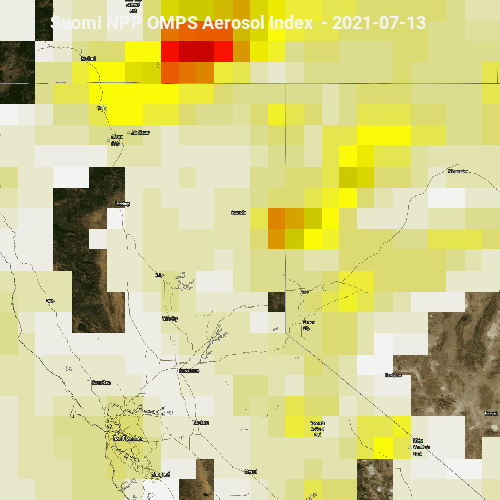

In [122]:
frames[0].save('OMPS_Aerosol_Index.gif',
               format='GIF',
               append_images=frames,
               save_all=True,
               duration=500,
               loop=0)

Image('OMPS_Aerosol_Index.gif')

In [127]:
tropomi_o3_dixie_ts =  firealarm_processing.spatial_timeseries(NEXUS_URL, 'TROPOMI-0.1deg-CA-CO', wildfires_bb, wildfires_start_time, wildfires_end_time)

url
 https://ideas-digitaltwin.jpl.nasa.gov/nexus/timeSeriesSpark?ds=TROPOMI-0.1deg-CA-CO&minLon=-123&minLat=39&maxLon=-120&maxLat=42&startTime=2021-07-01T00:00:00Z&endTime=2021-10-01T00:00:00Z&lowPassFilter=False

Waiting for response from FireAlarm...took 0.5740576249081641 seconds


In [129]:
viirs_aot_dixie_ts =  firealarm_processing.spatial_timeseries(NEXUS_URL, 'laads-1degx1deg-daily-global_Aerosol_Optical_Thickness_550_Land_Ocean_Mean', wildfires_bb, wildfires_start_time, wildfires_end_time)

url
 https://ideas-digitaltwin.jpl.nasa.gov/nexus/timeSeriesSpark?ds=laads-1degx1deg-daily-global_Aerosol_Optical_Thickness_550_Land_Ocean_Mean&minLon=-123&minLat=39&maxLon=-120&maxLat=42&startTime=2021-07-01T00:00:00Z&endTime=2021-10-01T00:00:00Z&lowPassFilter=False

Waiting for response from FireAlarm...took 0.3309533749707043 seconds


In [238]:
modis_aod_dixie_ts = firealarm_processing.spatial_timeseries(NEXUS_URL, 'MOD08_D3_6_1_Deep_Blue_Aerosol_Optical_Depth_550_Land_Mean', wildfires_bb, wildfires_start_time, wildfires_end_time)

url
 https://ideas-digitaltwin.jpl.nasa.gov/nexus/timeSeriesSpark?ds=MOD08_D3_6_1_Deep_Blue_Aerosol_Optical_Depth_550_Land_Mean&minLon=-123&minLat=39&maxLon=-120&maxLat=42&startTime=2021-07-01T00:00:00Z&endTime=2021-10-01T00:00:00Z&lowPassFilter=False

Waiting for response from FireAlarm...took 2.881792875006795 seconds


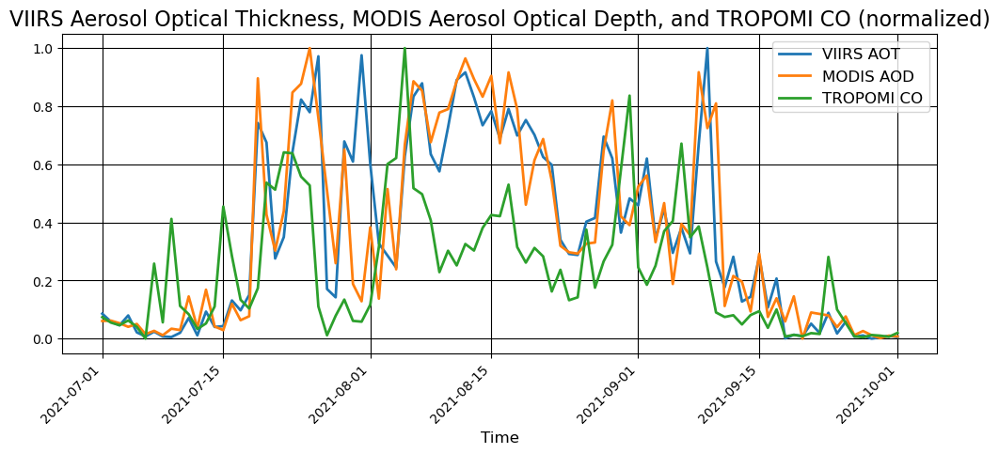

In [241]:
plotting.timeseries_plot([(viirs_aot_dixie_ts['maximum'], 'VIIRS AOT'), (modis_aod_dixie_ts['maximum'], 'MODIS AOD'), (tropomi_o3_dixie_ts['maximum'], 'TROPOMI CO')], 'Time', '', 'VIIRS Aerosol Optical Thickness, MODIS Aerosol Optical Depth, and TROPOMI CO (normalized)', norm=True)

### Dixie Fire Smoke Plume Visualization
On August 8, 2021, the Moderate Resolution Imaging Spectroradiometer (MODIS) on NASA’s Aqua satellite captured this image of the Dixie Fire.

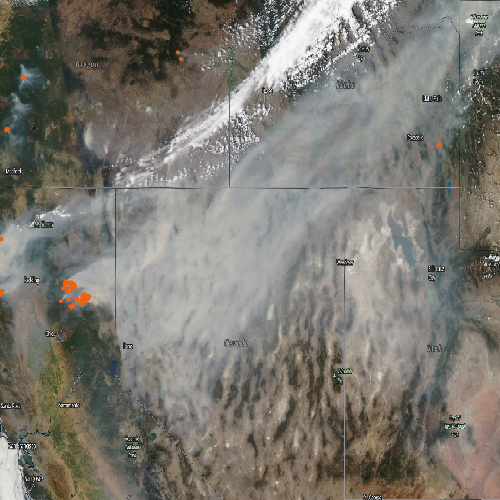

In [232]:
# Connect to GIBS WMS Service
wms = WebMapService('https://gibs.earthdata.nasa.gov/wms/epsg4326/best/wms.cgi?', version='1.3.0')

img = wms.getmap(layers=['BlueMarble_NextGeneration',
                         'MODIS_Aqua_CorrectedReflectance_TrueColor',
                         'MODIS_Aqua_Thermal_Anomalies_All',
                         'Reference_Features',
                         'Reference_Labels'],  # Layers
                 srs='epsg:4326',  # Map projection
                 bbox=(-123,37,-110,45),  # Bounds (min-lon, min-lat, max-lon, max-lat)
                 size=(500, 500),  # Image size
                 time='2021-08-08',  # Time of data
                 format='image/png',  # Image format
                 transparent=True)  # Nodata transparency

# View image
Image(img.read())

In [253]:
modis_subset_date = datetime(2021,8,8)
modis_dixie_subset = firealarm_processing.data_subsetting(NEXUS_URL, 'MYD08_D3_6_1_Deep_Blue_Aerosol_Optical_Depth_550_Land_Mean', {'min_lon': -125, 'max_lon': -100, 'min_lat': 30, 'max_lat': 50}, modis_subset_date, modis_subset_date)

url
 https://ideas-digitaltwin.jpl.nasa.gov/nexus/datainbounds?ds=MYD08_D3_6_1_Deep_Blue_Aerosol_Optical_Depth_550_Land_Mean&b=-125,30,-100,50&startTime=2021-08-08T00:00:00Z&endTime=2021-08-08T00:00:00Z&lowPassFilter=False

Waiting for response from FireAlarm...took 0.31574204203207046 seconds


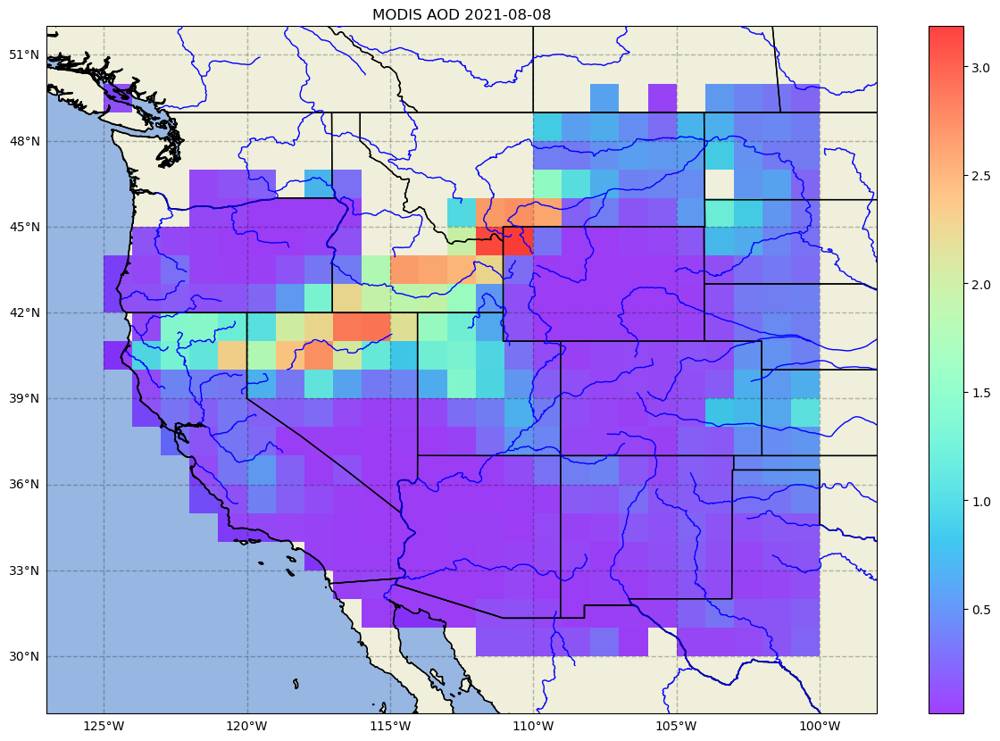

In [256]:
plotting.map_data(modis_dixie_subset[0], f'MODIS AOD {modis_subset_date.strftime("%Y-%m-%d")}')

#### NO2 Latitude Hovmöller

In [212]:
wildfires_parameters = (NEXUS_URL, 'MOD08_D3_6_1_Deep_Blue_Aerosol_Optical_Depth_550_Land_Mean', {'min_lon': -121, 'max_lon': -100, 'min_lat': 38, 'max_lat': 42}, datetime(2021,7,13), datetime(2021,9,20))
wildfires_lat_hov = firealarm_processing.hofmoeller(*wildfires_parameters, dim='longitude')

url
 https://ideas-digitaltwin.jpl.nasa.gov/nexus/longitudeTimeHofMoellerSpark?ds=MOD08_D3_6_1_Deep_Blue_Aerosol_Optical_Depth_550_Land_Mean&b=-121,38,-100,42&startTime=2021-07-13T00:00:00Z&endTime=2021-09-20T00:00:00Z

Waiting for response from FireAlarm... took 1.0960486660478637 seconds
70


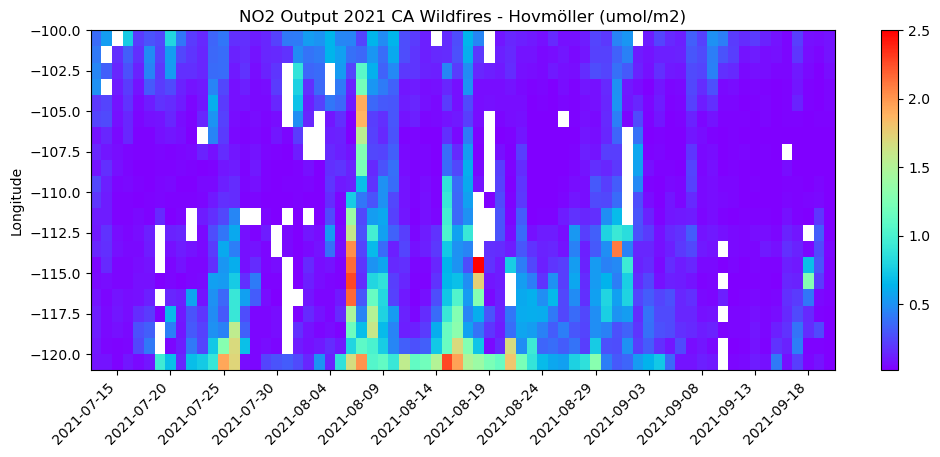

In [213]:
wildfires_hov_title = 'NO2 Output 2021 CA Wildfires - Hovmöller (umol/m2)'
plotting.heatmap(wildfires_lat_hov['mean'].transpose(), '', 'Longitude', wildfires_hov_title)

In [257]:
tropomi_co_dixie_map = firealarm_processing.temporal_mean(NEXUS_URL, 'TROPOMI-0.1deg-CA-CO', wildfires_bb, datetime(2021,7,15), datetime(2021,9,1))

url
 https://ideas-digitaltwin.jpl.nasa.gov/nexus/timeAvgMapSpark?ds=TROPOMI-0.1deg-CA-CO&b=-123,39,-120,42&startTime=2021-07-15T00:00:00Z&endTime=2021-09-01T00:00:00Z

Waiting for response from FireAlarm... took 3.1064589578891173 seconds


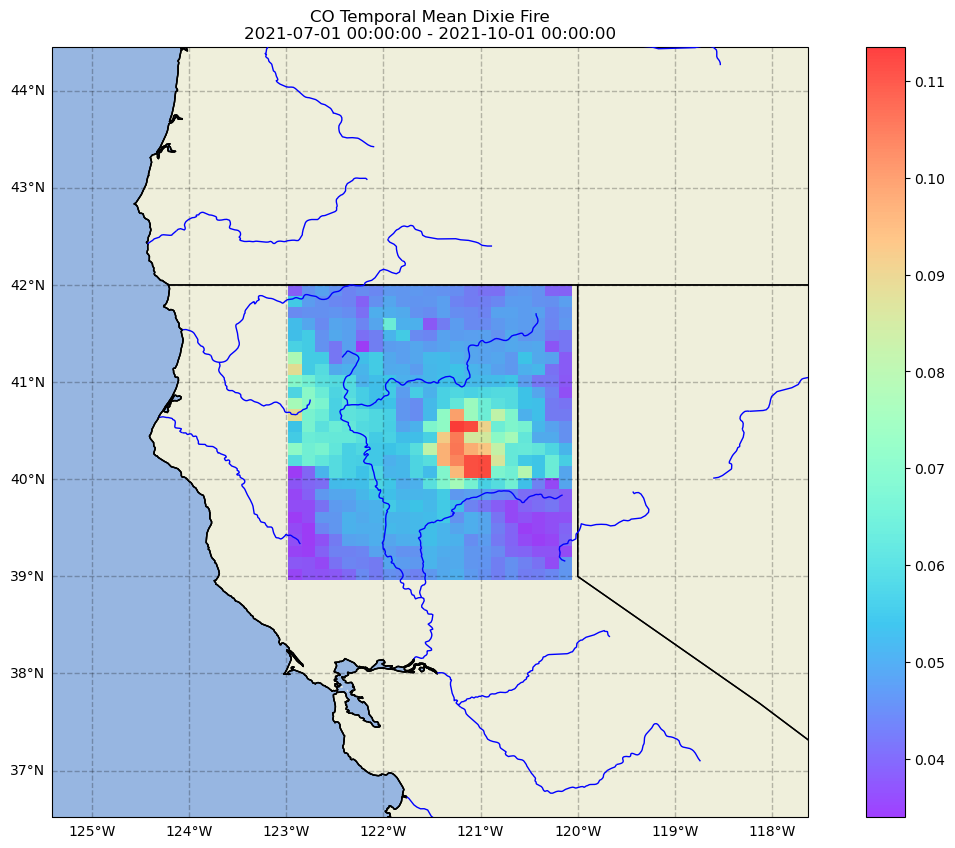

In [261]:
plotting.map_data(tropomi_co_dixie_map, f"CO Temporal Mean Dixie Fire\n{wildfires_start_time} - {wildfires_end_time}")

## In Situ for dixie fire

In [ ]:
# Map to plot sites

In [ ]:
# time series comparing sites

# 2018 Carr Wildfire


The Carr Fire was a large wildfire that burned in Shasta and Trinity Counties in California, United States. The fire started on July 23, 2018 and burned 229,651 acres, before it was 100% contained late on August 30, 2018.

Relevant Articles:
- https://www.mdpi.com/2073-4433/11/9/970 
- https://www.nps.gov/whis/learn/news/carrfire.htm

### Area of interest

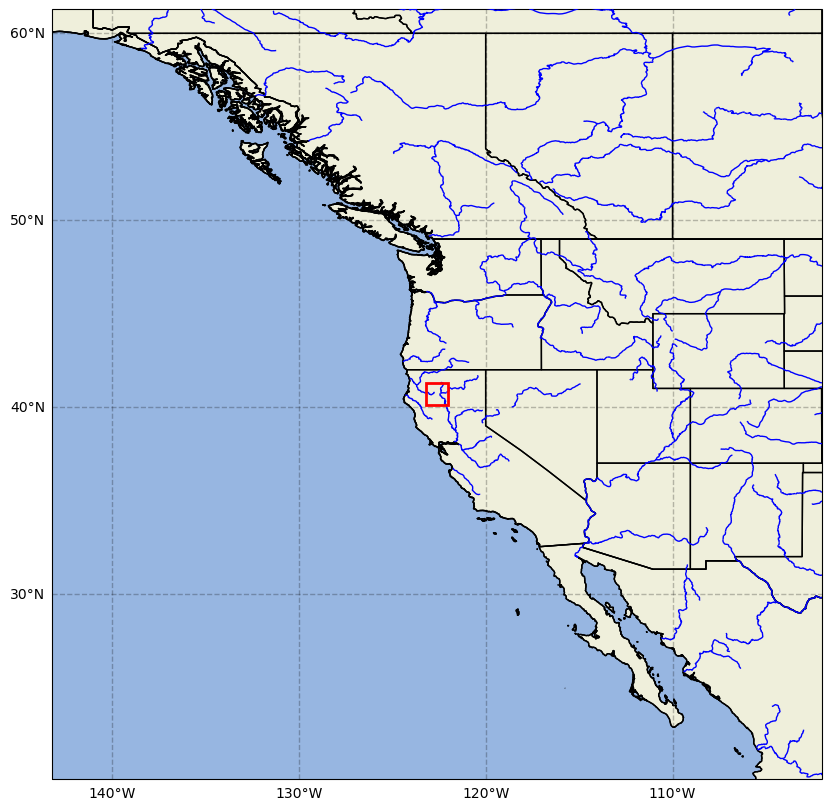

In [112]:
carr_bb = {
    'min_lon': -123.2,
    'max_lon': -122,
    'min_lat': 40.1,
    'max_lat': 41.3
}

carr_start_time = datetime(2018,6,1)
carr_end_time = datetime(2018,9,1)

carr_bbox = box(carr_bb['min_lon'], carr_bb['min_lat'], carr_bb['max_lon'], carr_bb['max_lat'])
plotting.map_box(carr_bb)

### NO2 Levels

#### NO2 Spatial Mean

In [84]:
from importlib import reload
reload(firealarm_processing)

<module 'firealarm_modules.firealarm_processing' from '/Users/marlis/Developer/AQACF/repos/FireAlarm-notebooks/firealarm_modules/firealarm_processing.py'>

In [86]:
carr_GCHP_NO2 = firealarm_processing.spatial_timeseries(NEXUS_URL, 'wustl-0.1degx0.1deg-daily-ca-SpeciesConc_NO2_D0', carr_bb, carr_start_time, carr_end_time)

url
 https://ideas-digitaltwin.jpl.nasa.gov/nexus/timeSeriesSpark?ds=wustl-0.1degx0.1deg-daily-ca-SpeciesConc_NO2_D0&minLon=-123.2&minLat=40.1&maxLon=-122&maxLat=41.3&startTime=2018-06-01T00:00:00Z&endTime=2018-09-01T00:00:00Z&lowPassFilter=False

Waiting for response from FireAlarm...took 0.470581709058024 seconds


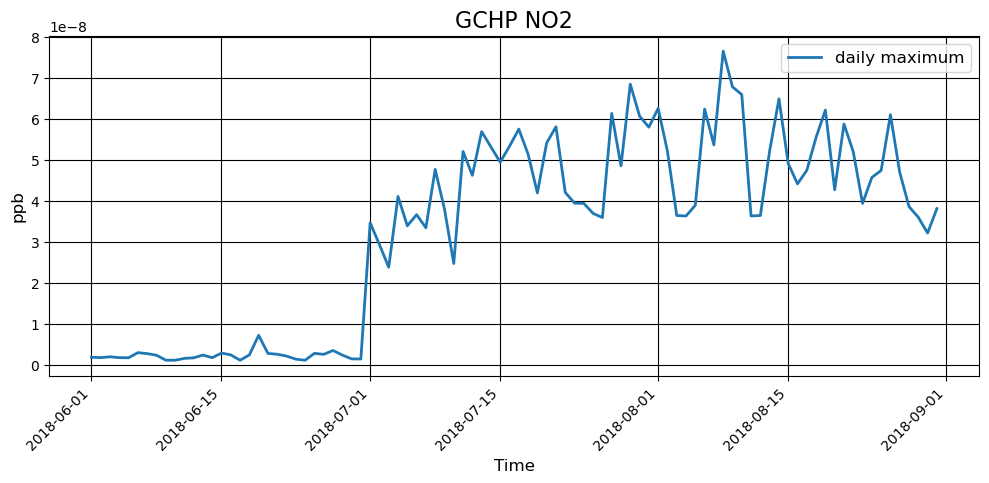

In [91]:
plotting.timeseries_plot([(carr_GCHP_NO2['maximum'], 'daily maximum')], 'Time', 'ppb', 'GCHP NO2')

#### NO2 Temporal Variance

In [289]:
# carr_bb = {
#     'min_lon': -125,
#     'max_lon': -119,
#     'min_lat': 32.1,
#     'max_lat': 41.3
# }
carr_temp_var_NO2 = firealarm_processing.max_min_map_spark(NEXUS_URL, 'nasa-merra-2-0.5-hourly-global-CDH', carr_bb, carr_start_time, carr_end_time)

url
 https://ideas-digitaltwin.jpl.nasa.gov/nexus/maxMinMapSpark?ds=nasa-merra-2-0.5-hourly-global-CDH&b=-123.2,40.1,-122,41.3&startTime=2018-06-01T00:00:00Z&endTime=2018-09-01T00:00:00Z

Waiting for response from FireAlarm... took 6.11380145791918 seconds


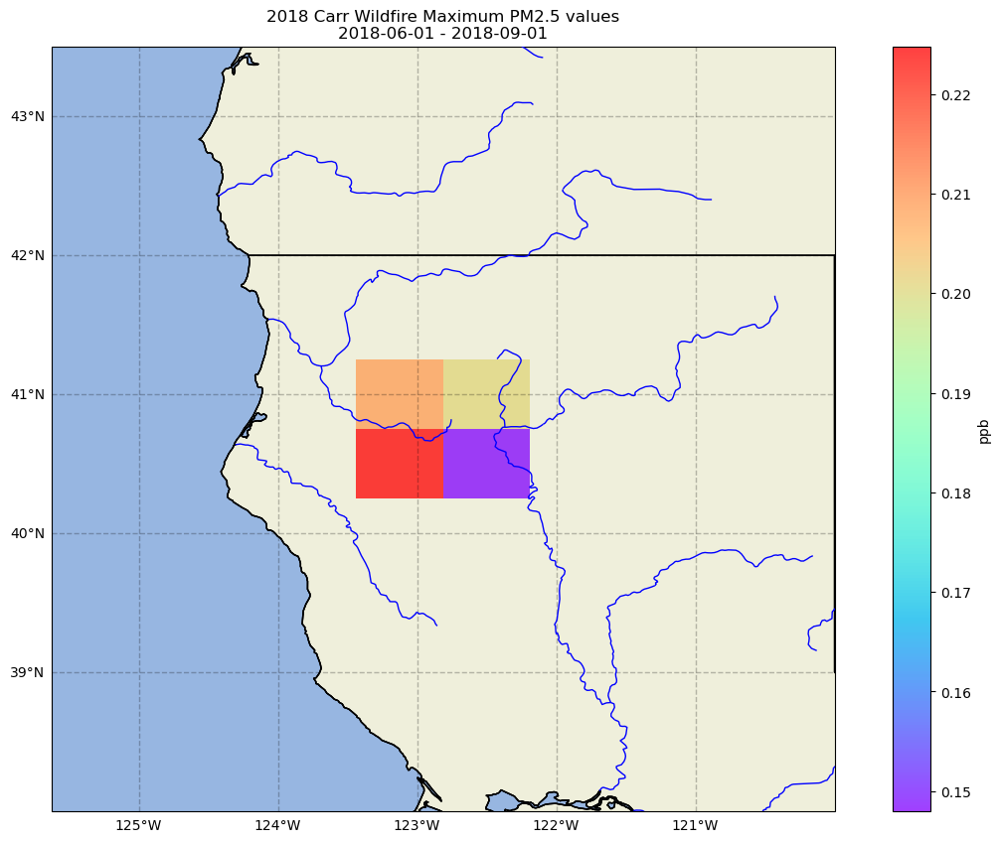

In [290]:
carr_variance_title = f'2018 Carr Wildfire Maximum PM2.5 values\n{str(carr_start_time)[:10]} - {str(carr_end_time)[:10]}'
plotting.map_data(carr_temp_var_NO2['maxima'].where(carr_temp_var_NO2['maxima']!= -9999).where(carr_temp_var_NO2['maxima']!= 0), carr_variance_title, cb_label='ppb')

#### NO2 Animation

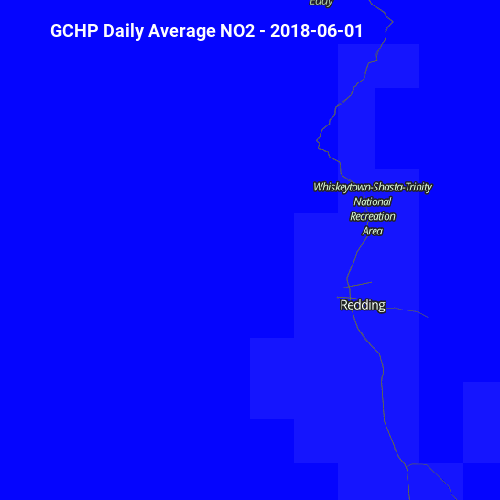

In [239]:
# Connect to FireAlarm OnEarth WMS Service
wms = WebMapService('https://ideas-digitaltwin.jpl.nasa.gov/wms/epsg4326/best/wms.cgi?', version='1.3.0')

layers = ['BlueMarble_NextGeneration',
          'wustl-0.1degx0.1deg-daily-ca_SpeciesConc_NO2',
          'Reference_Features',
          'Reference_Labels']
font = ImageFont.truetype('Roboto-Bold.ttf', size=18)
color = 'rgb(255,255,255)'
frames = []

dates = pd.date_range(carr_start_time,carr_end_time-timedelta(days=1),freq='d')

for day in dates:
    datatime = day.strftime("%Y-%m-%d")
    img = wms.getmap(layers=layers,  # Layers
                     srs='epsg:4326',  # Map projection
                     bbox=(carr_bb['min_lon'],
                           carr_bb['min_lat'],
                           carr_bb['max_lon'],
                           carr_bb['max_lat']), # Bounds
                     size=(500, 500),  # Image size
                     time=datatime,  # Time of data
                     format='image/png',  # Image format
                     transparent=True)  # Nodata transparency

    image = I.open(img)
    draw = ImageDraw.Draw(image)
    (x, y) = (50, 20)
    draw.text((x, y), f'GCHP Daily Average NO2 - {datatime}', fill=color, font=font)
    frames.append(image)
    
frames[0].save('wustl-0.1degx0.1deg-daily-ca_SpeciesConc_NO2_carr.gif',
               format='GIF',
               append_images=frames,
               save_all=True,
               duration=500,
               loop=0)

Image('wustl-0.1degx0.1deg-daily-ca_SpeciesConc_NO2_carr.gif')

### O3 Levels

#### O3 Spatial Mean

url
 https://ideas-digitaltwin.jpl.nasa.gov/nexus//timeSeriesSpark?ds=wustl-0.1degx0.1deg-daily-ca-SpeciesConc_O3_D0&minLon=-123.2&minLat=40.1&maxLon=-122&maxLat=41.3&startTime=2018-06-01T00:00:00Z&endTime=2018-09-01T00:00:00Z&lowPassFilter=False

Waiting for response from IDEAS...took 0.4505575119983405 seconds


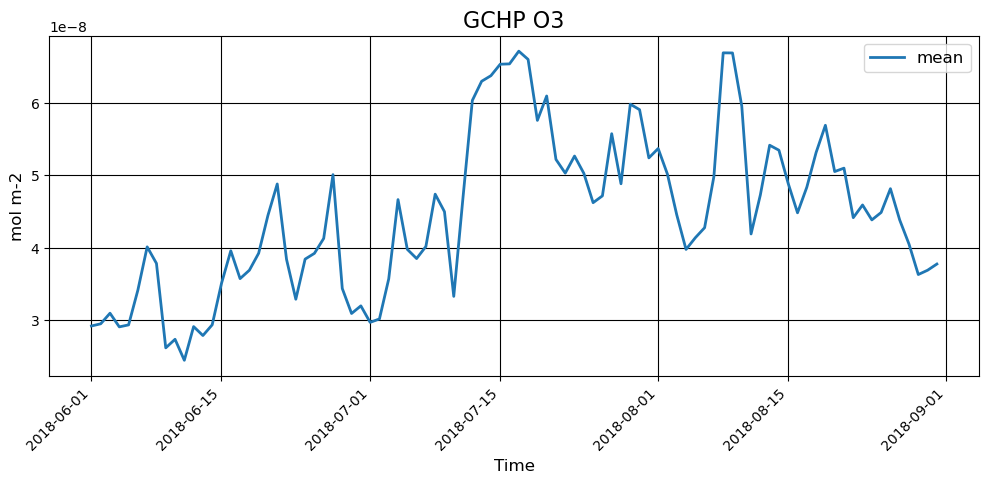

In [240]:
carr_O3 = firealarm_processing.spatial_timeseries(NEXUS_URL, 'wustl-0.1degx0.1deg-daily-ca-SpeciesConc_O3_D0', carr_bb, carr_start_time, carr_end_time)
plotting.timeseries_plot([(carr_O3['mean'], 'mean')], 'Time', units['O3'], 'GCHP O3')

#### O3 Temporal Variance

url
 https://ideas-digitaltwin.jpl.nasa.gov/nexus//varianceSpark?ds=wustl-0.1degx0.1deg-daily-ca-SpeciesConc_O3_D0&minLon=-123.2&minLat=40.1&maxLon=-122&maxLat=41.3&startTime=2018-06-01T00:00:00Z&endTime=2018-09-01T00:00:00Z

Waiting for response from IDEAS... took 1.074143515987089 seconds


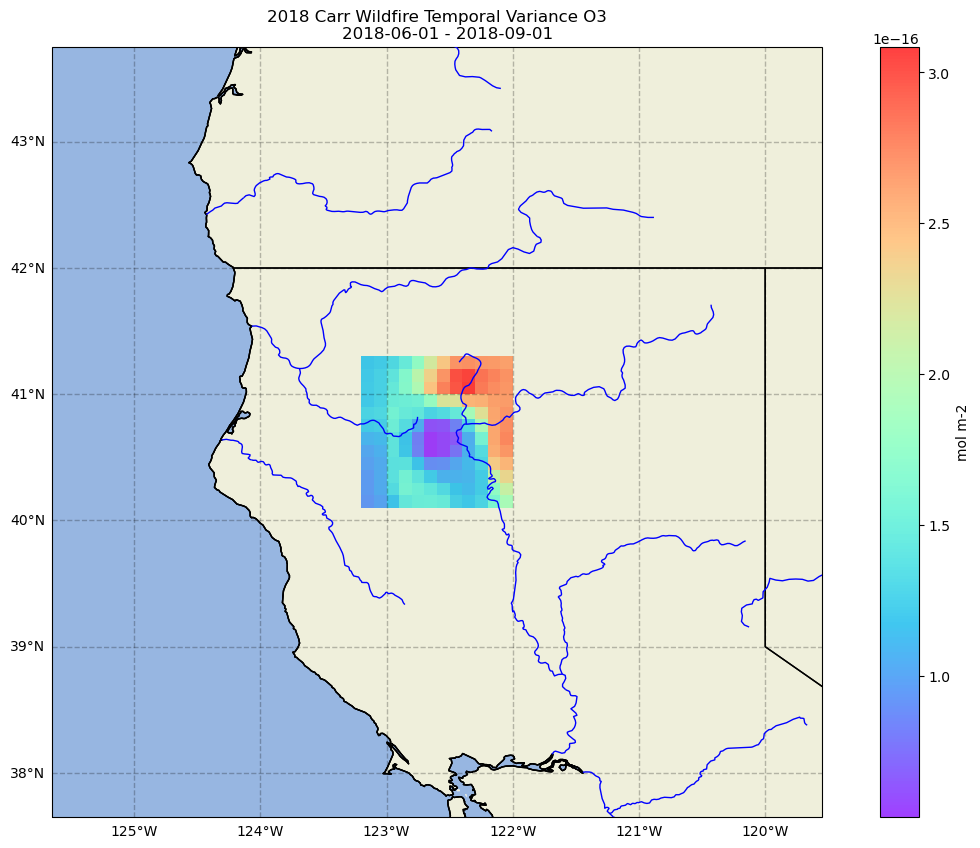

In [241]:
carr_temp_var_O3 = firealarm_processing.temporal_variance(NEXUS_URL, 'wustl-0.1degx0.1deg-daily-ca-SpeciesConc_O3_D0', carr_bb, carr_start_time, carr_end_time)
carr_variance_title = f'2018 Carr Wildfire Temporal Variance O3\n\
    {str(carr_start_time)[:10]} - {str(carr_end_time)[:10]}'
plotting.map_data(carr_temp_var_O3, carr_variance_title, cb_label=units['O3'])

# Los Angeles ports backlog Fall 2021
Beginning around October 2021, the Ports of Los Angeles and Long Beach started suffering serious backlogs of ships due a surge in e-commerence because of the COVID-19 pandemic. This resulted in many ships anchored in the ports and releasing high amounts of pollutants. 

Relevant Articles:
- https://earthobservatory.nasa.gov/images/149004/scientific-questions-arrive-in-ports
- https://earthobservatory.nasa.gov/images/148956/waiting-to-unload
- https://www.whitehouse.gov/briefing-room/statements-releases/2021/10/13/fact-sheet-biden-administration-efforts-to-address-bottlenecks-at-ports-of-los-angeles-and-long-beach-moving-goods-from-ship-to-shelf/ 

### Area of interest

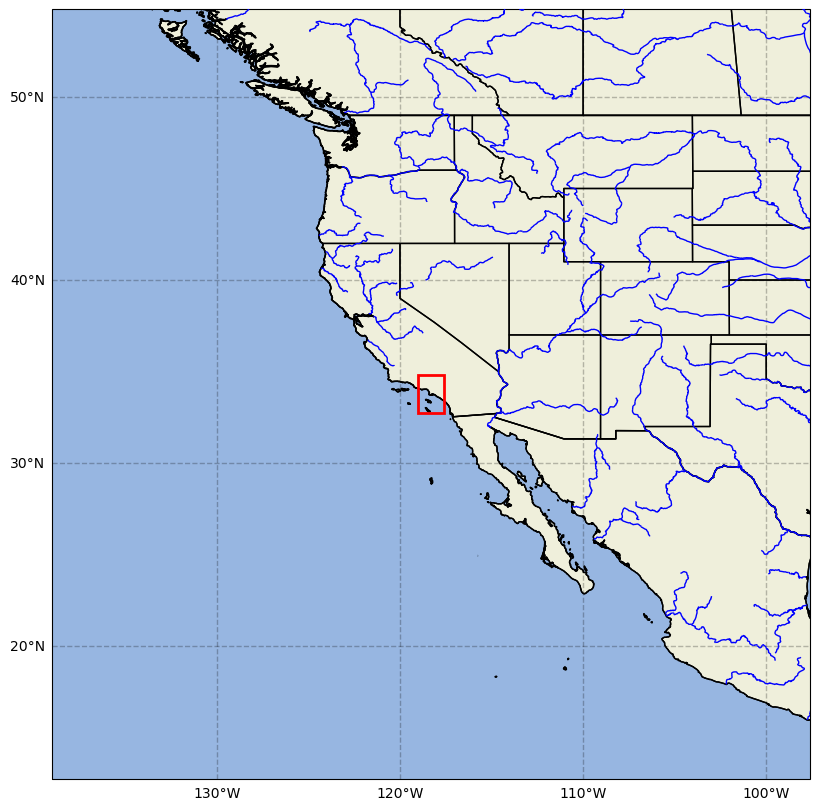

In [292]:
la_ports_bb = {
    'min_lon': -119,
    'max_lon': -117.6,
    'min_lat': 32.75,
    'max_lat': 34.8
}

la_ports_start_time = datetime(2021,9,1)
la_ports_end_time = datetime(2022,12,31)

la_ports_bbox = box(la_ports_bb['min_lon'], la_ports_bb['min_lat'], la_ports_bb['max_lon'], la_ports_bb['max_lat'])
plotting.map_box(la_ports_bb)

In [299]:
la_ports_tropomi_no2 = firealarm_processing.spatial_timeseries(NEXUS_URL, 'TROPOMI-0.1deg-CA-NO2', la_ports_bb, la_ports_start_time, la_ports_end_time)
la_ports_tropomi_so2 = firealarm_processing.spatial_timeseries(NEXUS_URL, 'TROPOMI-0.1deg-CA-SO2', la_ports_bb, la_ports_start_time, la_ports_end_time)

url
 https://ideas-digitaltwin.jpl.nasa.gov/nexus/timeSeriesSpark?ds=TROPOMI-0.1deg-CA-NO2&minLon=-119&minLat=32.75&maxLon=-117.6&maxLat=34.8&startTime=2021-09-01T00:00:00Z&endTime=2022-12-31T00:00:00Z&lowPassFilter=False

Waiting for response from FireAlarm...took 3.0195417089853436 seconds
url
 https://ideas-digitaltwin.jpl.nasa.gov/nexus/timeSeriesSpark?ds=TROPOMI-0.1deg-CA-SO2&minLon=-119&minLat=32.75&maxLon=-117.6&maxLat=34.8&startTime=2021-09-01T00:00:00Z&endTime=2022-12-31T00:00:00Z&lowPassFilter=False

Waiting for response from FireAlarm...took 1.0423993329750374 seconds


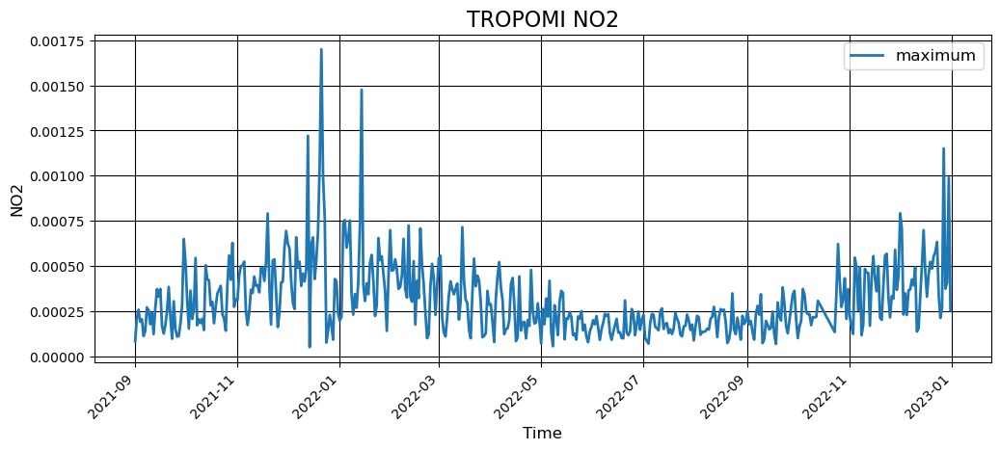

In [297]:
plotting.timeseries_plot([(la_ports_tropomi_no2['maximum'], 'maximum')], 'Time', 'NO2', 'TROPOMI NO2')

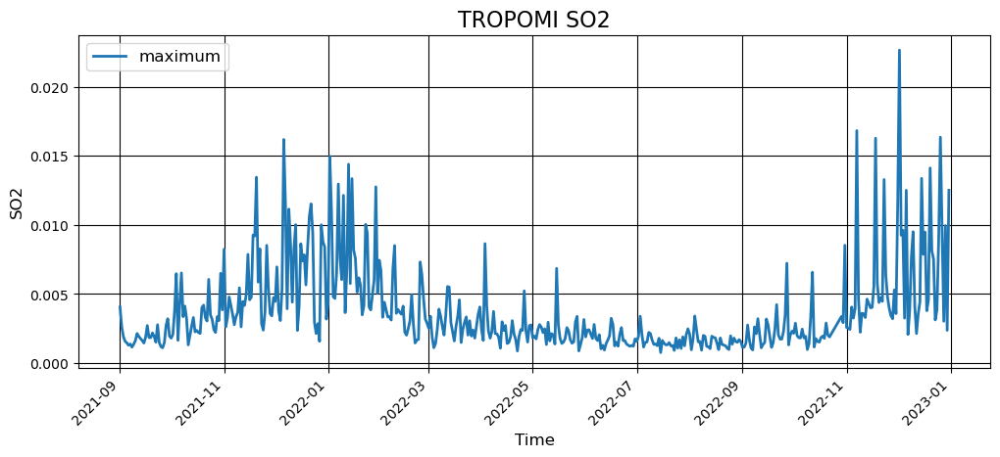

In [300]:
plotting.timeseries_plot([(la_ports_tropomi_so2['maximum'], 'maximum')], 'Time', 'SO2', 'TROPOMI SO2')

In [296]:
la_ports_SO2_daily_diff_data = firealarm_processing.daily_diff(NEXUS_URL, 'laads-1degx1deg-daily-global_Aerosol_Optical_Thickness_550_Land_Ocean_Mean', 'laads-1degx1deg-daily-global_Aerosol_Optical_Thickness_550_Land_Ocean_Mean_clim', la_ports_bb, la_ports_start_time, la_ports_end_time)

url
 https://ideas-digitaltwin.jpl.nasa.gov/nexus/dailydifferenceaverage_spark?dataset=laads-1degx1deg-daily-global_Aerosol_Optical_Thickness_550_Land_Ocean_Mean&climatology=laads-1degx1deg-daily-global_Aerosol_Optical_Thickness_550_Land_Ocean_Mean_clim&b=-119,32.75,-117.6,34.8&startTime=2021-09-01T00:00:00Z&endTime=2022-12-31T00:00:00Z

Waiting for response from FireAlarm... took 4.016505541047081 seconds


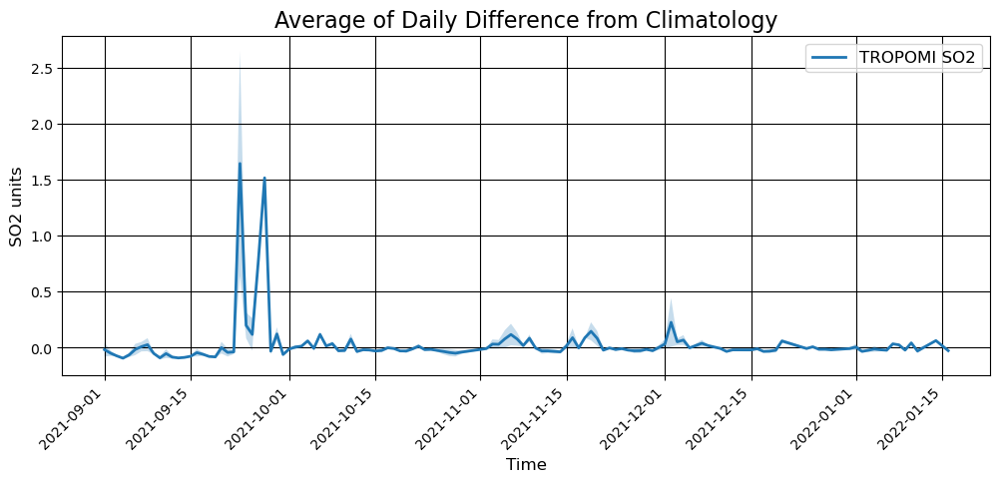

In [298]:
plotting.timeseries_bands_plot(la_ports_SO2_daily_diff_data, 'TROPOMI SO2', 'Time', 'SO2 units', 'Average of Daily Difference from Climatology')

#### NO2 Animation

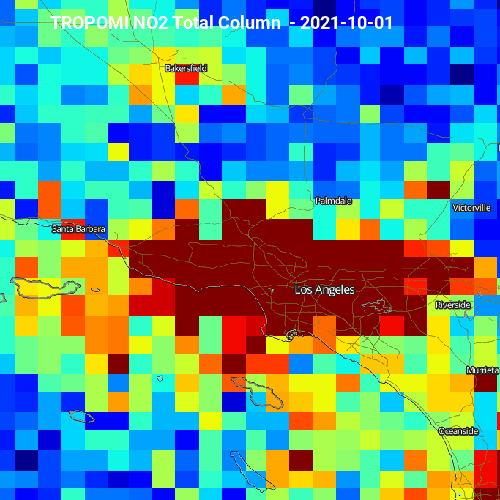

In [251]:
# Connect to FireAlarm OnEarth WMS Service
wms = WebMapService('https://ideas-digitaltwin.jpl.nasa.gov/wms/epsg4326/best/wms.cgi?', version='1.3.0')

layers = ['BlueMarble_NextGeneration',
          'TROPOMI_nitrogendioxide_tropospheric_column',
          'Reference_Features',
          'Reference_Labels']
font = ImageFont.truetype('Roboto-Bold.ttf', size=18)
color = 'rgb(255,255,255)'
frames = []

dates = pd.date_range(la_ports_start_time,la_ports_end_time-timedelta(days=1),freq='d')

for day in dates:
    datatime = day.strftime("%Y-%m-%d")
    img = wms.getmap(layers=layers,  # Layers
                     srs='epsg:4326',  # Map projection
                     bbox=(la_ports_bb['min_lon'],
                           la_ports_bb['min_lat']+0.75,
                           la_ports_bb['max_lon'],
                           la_ports_bb['max_lat']+0.75), # Bounds
                     size=(500, 500),  # Image size
                     time=datatime,  # Time of data
                     format='image/png',  # Image format
                     transparent=True)  # Nodata transparency

    image = I.open(img)
    draw = ImageDraw.Draw(image)
    (x, y) = (50, 12)
    draw.text((x, y), f'TROPOMI NO2 Total Column  - {datatime}', fill=color, font=font)
    frames.append(image)
    
frames[0].save('TROPOMI_nitrogendioxide_tropospheric_column.gif',
               format='GIF',
               append_images=frames,
               save_all=True,
               duration=500,
               loop=0)

Image('TROPOMI_nitrogendioxide_tropospheric_column.gif')

# Fireworks during 4th of July 2022 in Los Angeles County
Despite fireworks being outlawed for personal use in Los Angeles County, there is a significant amount of illegal fireworks displays in the area around 4th of July that cause very smoggy conditions.  
Below we model our in situ Particulate matter 2.5 and Black Carbon data from around 4th of July 

Relevant Articles:
- http://www.aqmd.gov/docs/default-source/news-archive/2022/fireworks-advisory-7-2-2022.pdf
- https://www.latimes.com/california/story/2022-07-05/poor-air-quality-lingering-in-los-angeles-after-fourth-of-firework-shows 

### Area of Interest

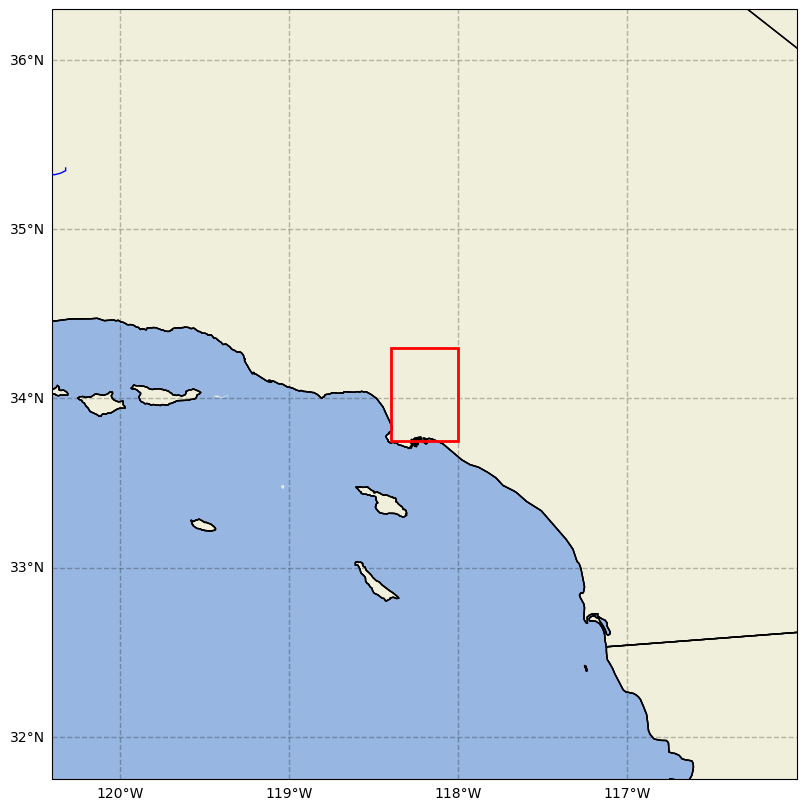

In [311]:
la_fireworks_bb = {
    'min_lon': -118.4,
    'max_lon': -118,
    'min_lat': 33.75,
    'max_lat': 34.3
}
la_fireworks_start_time = datetime(2021,6,1)
la_fireworks_end_time = datetime(2021,7,14)
plotting.map_box(la_fireworks_bb, padding=2)

### Get PM 2.5 and Black Carbon (BC) from B301 GRIMM Aethalometer (2021-06-28 to 2021-07-11)

In [337]:
from importlib import reload
reload(firealarm_processing)

<module 'firealarm_modules.firealarm_processing' from '/Users/marlis/Developer/AQACF/repos/FireAlarm-notebooks/firealarm_modules/firealarm_processing.py'>

In [343]:
bb_string_fireworks       = '-120,30,-115,40'
provider_fireworks        = 'B301-GRIMM-Aethalometer'

pm25_bc_2021_fireworks = firealarm_processing.insitu(NEXUS_URL, provider_fireworks, 'AQACF', 
                                                 bb_string_fireworks, datetime(2021,6,24), 
                                                 datetime(2021,7,6))
pm25_bc_2021_fireworks 

https://ideas-digitaltwin.jpl.nasa.gov/insitu/1.0/query_data_doms_custom_pagination?startIndex=0&itemsPerPage=10000&provider=B301-GRIMM-Aethalometer&project=AQACF&startTime=2021-06-24T00:00:00Z&endTime=2021-07-06T00:00:00Z&bbox=-120,30,-115,40
http://ideas-digitaltwin.jpl.nasa.gov/insitu/1.0/query_data_doms_custom_pagination?startIndex=0&itemsPerPage=10000&provider=B301-GRIMM-Aethalometer&project=AQACF&startTime=2021-06-24T00:00:00Z&endTime=2021-07-06T00:00:00Z&bbox=-120,30,-115,40&markerTime=2021-07-06T00:00:00Z&markerPlatform=6ef472c3b6e919b1c6175d166f05bbb9e3761e4a702138db3c30ab70194bcffa


,provider,project,time,latitude,longitude,pm2_5,bc,job_id
0,B301-GRIMM-Aethalometer,AQACF,2021-06-24 00:00:00+00:00,34.2013,-118.1714,2.464306,0.348033,b69cf0d6-e502-4943-89d5-cc1ddbc8362b
1,B301-GRIMM-Aethalometer,AQACF,2021-06-24 01:00:00+00:00,34.2013,-118.1714,2.694444,0.446850,b69cf0d6-e502-4943-89d5-cc1ddbc8362b
2,B301-GRIMM-Aethalometer,AQACF,2021-06-24 02:00:00+00:00,34.2013,-118.1714,2.666945,0.533933,b69cf0d6-e502-4943-89d5-cc1ddbc8362b
3,B301-GRIMM-Aethalometer,AQACF,2021-06-24 03:00:00+00:00,34.2013,-118.1714,2.590139,0.448750,b69cf0d6-e502-4943-89d5-cc1ddbc8362b
4,B301-GRIMM-Aethalometer,AQACF,2021-06-24 04:00:00+00:00,34.2013,-118.1714,2.686110,0.391533,b69cf0d6-e502-4943-89d5-cc1ddbc8362b
...,...,...,...,...,...,...,...,...
282,B301-GRIMM-Aethalometer,AQACF,2021-07-05 21:00:00+00:00,34.2013,-118.1714,10.875560,0.401833,b69cf0d6-e502-4943-89d5-cc1ddbc8362b
283,B301-GRIMM-Aethalometer,AQACF,2021-07-05 22:00:00+00:00,34.2013,-118.1714,10.995830,0.423283,b69cf0d6-e502-4943-89d5-cc1ddbc8362b
284,B301-GRIMM-Aethalometer,AQACF,2021-07-05 23:00:00+00:00,34.2013,-118.1714,10.930415,0.440467,b69cf0d6-e502-4943-89d5-cc1ddbc8362b
285,B301-GRIMM-Aethalometer,AQACF,2021-07-06 00:00:00+00:00,34.2013,-118.1714,10.467495,0.347533,b69cf0d6-e502-4943-89d5-cc1ddbc8362b


### Get PM 2.5 and Black Carbon (BC) from B301 GRIMM Aethalometer (2022-06-28 to 2022-07-11)

In [342]:
pm25_bc_2022_fireworks = firealarm_processing.insitu(NEXUS_URL, provider_fireworks, 'AQACF', 
                                                 bb_string_fireworks, datetime(2022,6,24),  datetime(2022,7,6))
pm25_bc_2022_fireworks 

https://ideas-digitaltwin.jpl.nasa.gov/insitu/1.0/query_data_doms_custom_pagination?startIndex=0&itemsPerPage=10000&provider=B301-GRIMM-Aethalometer&project=AQACF&startTime=2022-06-24T00:00:00Z&endTime=2022-07-06T00:00:00Z&bbox=-120,30,-115,40
http://ideas-digitaltwin.jpl.nasa.gov/insitu/1.0/query_data_doms_custom_pagination?startIndex=0&itemsPerPage=10000&provider=B301-GRIMM-Aethalometer&project=AQACF&startTime=2022-06-24T00:00:00Z&endTime=2022-07-06T00:00:00Z&bbox=-120,30,-115,40&markerTime=2022-07-06T00:00:00Z&markerPlatform=6a4ee878aec8ffde4a5ecf10bf9c1888b2f0598914b1cd5914a6287beedd0d38


,provider,project,time,latitude,longitude,pm2_5,bc,job_id
0,B301-GRIMM-Aethalometer,AQACF,2022-06-24 00:00:00+00:00,34.2013,-118.1714,7.859440,0.698283,b69cf0d6-e502-4943-89d5-cc1ddbc8362b
1,B301-GRIMM-Aethalometer,AQACF,2022-06-24 01:00:00+00:00,34.2013,-118.1714,7.171106,0.600050,b69cf0d6-e502-4943-89d5-cc1ddbc8362b
2,B301-GRIMM-Aethalometer,AQACF,2022-06-24 02:00:00+00:00,34.2013,-118.1714,6.608888,0.619167,b69cf0d6-e502-4943-89d5-cc1ddbc8362b
3,B301-GRIMM-Aethalometer,AQACF,2022-06-24 03:00:00+00:00,34.2013,-118.1714,5.545556,0.549433,b69cf0d6-e502-4943-89d5-cc1ddbc8362b
4,B301-GRIMM-Aethalometer,AQACF,2022-06-24 04:00:00+00:00,34.2013,-118.1714,5.177220,0.484850,b69cf0d6-e502-4943-89d5-cc1ddbc8362b
...,...,...,...,...,...,...,...,...
285,B301-GRIMM-Aethalometer,AQACF,2022-07-05 21:00:00+00:00,34.2013,-118.1714,8.246655,0.323250,b69cf0d6-e502-4943-89d5-cc1ddbc8362b
286,B301-GRIMM-Aethalometer,AQACF,2022-07-05 22:00:00+00:00,34.2013,-118.1714,6.867780,0.259017,b69cf0d6-e502-4943-89d5-cc1ddbc8362b
287,B301-GRIMM-Aethalometer,AQACF,2022-07-05 23:00:00+00:00,34.2013,-118.1714,5.186119,0.304833,b69cf0d6-e502-4943-89d5-cc1ddbc8362b
288,B301-GRIMM-Aethalometer,AQACF,2022-07-06 00:00:00+00:00,34.2013,-118.1714,5.738332,0.550300,b69cf0d6-e502-4943-89d5-cc1ddbc8362b


In [362]:
from importlib import reload
reload(plotting)

<module 'firealarm_modules.plotting' from '/Users/marlis/Developer/AQACF/repos/FireAlarm-notebooks/firealarm_modules/plotting.py'>

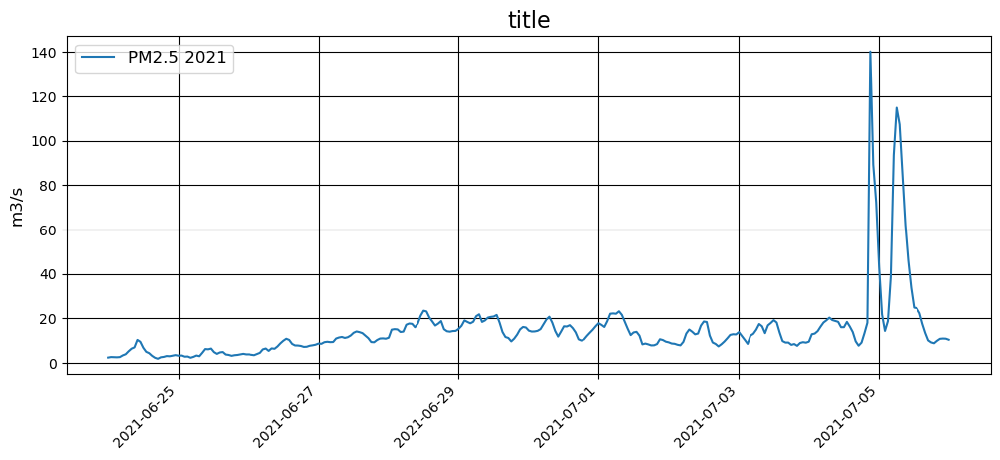

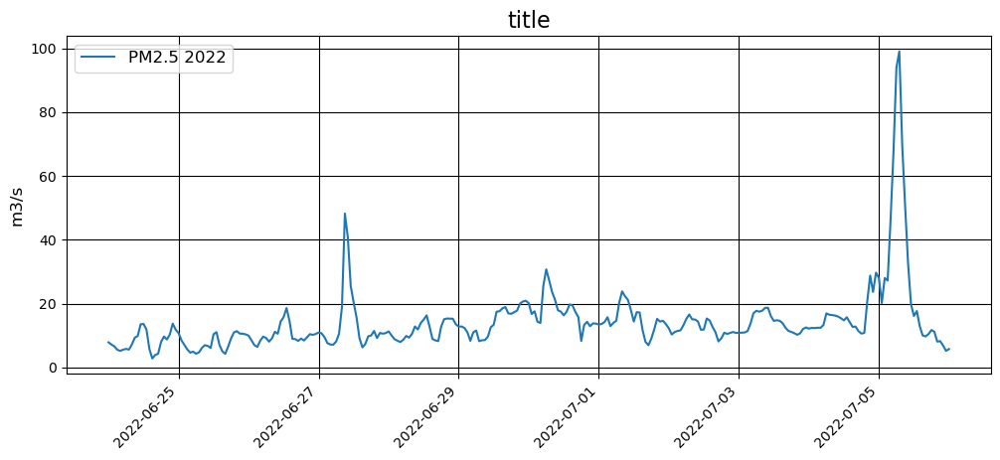

In [363]:
plotting.plot_insitu([(pm25_bc_2021_fireworks, 'pm2_5', 'PM2.5 2021')], 'title')
plotting.plot_insitu([(pm25_bc_2022_fireworks, 'pm2_5', 'PM2.5 2022')], 'title')

## Compare 2021 and 2022 emissions 
Unlike last year, PM2.5 levels showed only a minor elevation during the night of July 4th. However, a large peak (up to 100 µg/m3) was observed during the morning of July 5th, comparable to the levels measured last year, most likely due to the transport of smoke from South/Central LA.

As expected, Black Carbon (BC) levels did not show an appreciable increase during the fireworks event. Fireworks do not emit very large amounts of BC relative to other species. Organic and inorganic aerosols (particularly metals) dominate emissions from fireworks. A PM2.5 sample was collected, using the Aerosol Mass and Optical Depth (AMOD) instrument, for chemical analysis which includes X-ray fluorescence (XRF) spectroscopy for detection of metals.

In [318]:
time_2021_fireworks = np.array(pm25_bc_2021_fireworks['time'])
pm25_2021_fireworks = np.array(pm25_bc_2021_fireworks['pm2_5'])
bc_2021_fireworks   = np.array(pm25_bc_2021_fireworks['bc'])

time_2022_fireworks = np.array(pm25_bc_2022_fireworks['time'])
pm25_2022_fireworks = np.array(pm25_bc_2022_fireworks['pm2_5'])
bc_2022_fireworks   = np.array(pm25_bc_2022_fireworks['bc'])

ValueError: Axis limits cannot be NaN or Inf

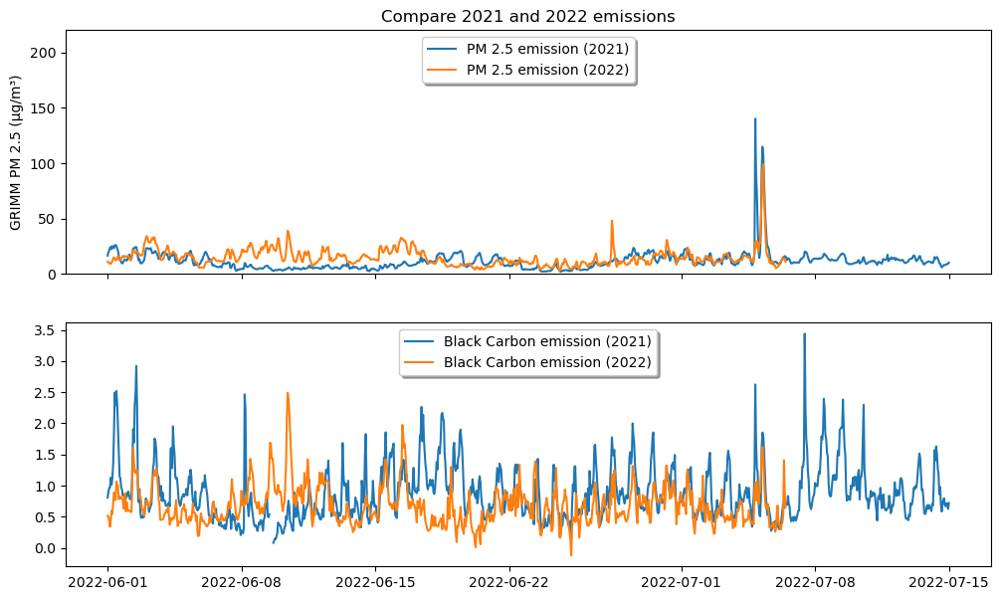

In [319]:
y_datas = [ pm25_2021_fireworks, pm25_2022_fireworks, bc_2021_fireworks, bc_2022_fireworks ]
x_datas = [ time_2021_fireworks, time_2022_fireworks, time_2021_fireworks, time_2022_fireworks ]
series_labels = [ 'PM 2.5 emission (2021)', 'PM 2.5 emission (2022)', 
                  'Black Carbon emission (2021)', 'Black Carbon emission (2022)' ]
y_labels = [ 'GRIMM PM 2.5 (µg/m³)', 'BC (µg/m³)' ]

plotting.stacked_overlay_plot(x_datas=x_datas, y_datas=y_datas, series_labels=series_labels,
                       y_labels=y_labels, title='Compare 2021 and 2022 emissions', top_paddings=[80, 2])

## Predicting What We Breath (PWWB) - LA County May 2022

In [262]:
pwwb_NO2 = 'PWWB-preds-40x40-hourly-LA_County-NO2'
pwwb_PM25 = 'PWWB-preds-40x40-hourly-LA_County-PM25'

pwwb_start_time = datetime(2022, 5, 10)
pwwb_end_time = datetime(2022, 5, 31)

### Data Processing

In [263]:
pwwb_pm25_mean = firealarm_processing.spatial_timeseries(NEXUS_URL, pwwb_PM25, la_ports_bb, pwwb_start_time, pwwb_end_time)
pwwb_pm25_mean

url
 https://ideas-digitaltwin.jpl.nasa.gov/nexus//timeSeriesSpark?ds=PWWB-preds-40x40-hourly-LA_County-PM25&minLon=-120&minLat=32&maxLon=-117&maxLat=35&startTime=2022-05-10T00:00:00Z&endTime=2022-05-31T00:00:00Z&lowPassFilter=False

Waiting for response from IDEAS...took 0.602561601990601 seconds


<xarray.Dataset>
Dimensions:  (time: 101)
Coordinates:
  * time     (time) datetime64[ns] 2022-05-10 2022-05-10 ... 2022-05-31
Data variables:
    mean     (time) float64 9.315 9.52 9.549 9.327 ... 4.341 4.289 4.178 4.257
    minimum  (time) float64 0.577 0.4724 0.5275 0.4469 ... 0.4069 0.478 0.5526
    maximum  (time) float64 19.88 18.74 18.43 18.83 ... 21.27 18.92 18.8 22.73

In [264]:
pwwb_NO2_mean = firealarm_processing.spatial_timeseries(NEXUS_URL, pwwb_NO2, la_ports_bb, pwwb_start_time, pwwb_end_time)
pwwb_NO2_mean

url
 https://ideas-digitaltwin.jpl.nasa.gov/nexus//timeSeriesSpark?ds=PWWB-preds-40x40-hourly-LA_County-NO2&minLon=-120&minLat=32&maxLon=-117&maxLat=35&startTime=2022-05-10T00:00:00Z&endTime=2022-05-31T00:00:00Z&lowPassFilter=False

Waiting for response from IDEAS...took 0.4738513460033573 seconds


<xarray.Dataset>
Dimensions:  (time: 88)
Coordinates:
  * time     (time) datetime64[ns] 2022-05-10 2022-05-10 ... 2022-05-31
Data variables:
    mean     (time) float64 9.57 9.584 9.449 9.511 ... 4.187 4.331 4.338 4.331
    minimum  (time) float64 0.5518 0.5557 0.5603 0.5456 ... 0.5391 0.4098 0.4805
    maximum  (time) float64 20.23 21.84 19.98 19.64 ... 21.06 21.01 20.2 18.84

In [265]:
pwwb_pm25_data = firealarm_processing.data_subsetting(NEXUS_URL, pwwb_PM25, la_ports_bb, pwwb_start_time, datetime(2022, 5, 23, 23, 59, 59))
pwwb_pm25_data

url
 https://ideas-digitaltwin.jpl.nasa.gov/nexus//datainbounds?ds=PWWB-preds-40x40-hourly-LA_County-PM25&b=-120,32,-117,35&startTime=2022-05-10T00:00:00Z&endTime=2022-05-23T23:59:59Z&lowPassFilter=False

Waiting for response from IDEAS...took 3.3748314419935923 seconds


<xarray.DataArray (time: 39, lat: 40, lon: 40)>
array([[[ 0.57697845,  0.60591817,  0.63296676, ..., 15.07278061,
         13.93187809, 13.02386665],
        [ 0.59661061,  0.63733643,  0.68244445, ..., 14.86309814,
         13.73324871, 12.86341763],
        [ 0.62280536,  0.6827808 ,  0.76580453, ..., 14.56307697,
         13.4640646 , 12.63550568],
        ...,
        [14.58056164, 13.46151733, 11.87439919, ...,  8.19131851,
          6.81005383,  5.58843803],
        [14.65208244, 13.53009033, 12.05897808, ...,  6.46140671,
          5.48175049,  4.58449268],
        [14.46662426, 13.42206955, 12.13318634, ...,  4.97567081,
          4.44011593,  3.99501038]],

       [[ 0.48152393,  0.48316345,  0.49096349, ..., 15.41535759,
         14.01448536, 12.73119545],
        [ 0.51854038,  0.53290498,  0.55133647, ..., 15.09315586,
         13.52581596, 12.09778976],
        [ 0.57843977,  0.61678666,  0.6553939 , ..., 14.85102558,
         13.29563332, 11.91980457],
...
        [13.45498466, 15.02528477, 16.72888756, ..., 12.72309399,
         11.9642725 , 11.81342888],
        [12.50756454, 13.97409821, 15.57980347, ...,  9.97145653,
          9.3111515 ,  9.40164089],
        [11.85976791, 13.10556507, 14.56003284, ...,  7.68091297,
          7.60234165,  8.29436207]],

       [[ 0.47275558,  0.48910308,  0.52826124, ..., 12.61479759,
         14.2701683 , 15.96211624],
        [ 0.50527114,  0.52940452,  0.56822324, ..., 13.6340847 ,
         14.70500755, 15.96404457],
        [ 0.5504421 ,  0.58148587,  0.61891466, ..., 15.06768513,
         15.42918873, 16.10503387],
        ...,
        [10.94967842, 10.50015736, 10.72887707, ...,  9.7598114 ,
          8.11253834,  7.42076111],
        [10.54737663, 10.51881599, 10.88154888, ...,  8.13713837,
          5.96481848,  4.61092091],
        [10.55164433, 11.13842297, 11.88994789, ...,  7.25167322,
          5.04500532,  3.35320663]]])
Coordinates:
  * time     (time) int64 1652180371 1652184000 ... 1653321628 1653325171
  * lat      (lat) float64 33.53 33.55 33.58 33.6 ... 34.42 34.45 34.47 34.5
  * lon      (lon) float64 -118.8 -118.7 -118.7 -118.7 ... -117.6 -117.6 -117.5

### PM 2.5 Spatial Mean

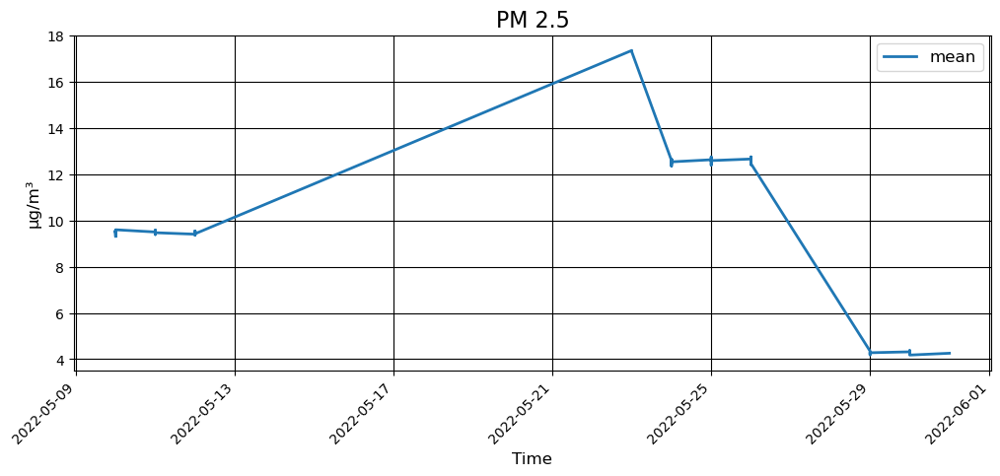

In [266]:
plotting.timeseries_plot([(pwwb_pm25_mean['mean'], 'mean')], 'Time', units['pm25'], 'PM 2.5')

### NO2 Spatial Mean

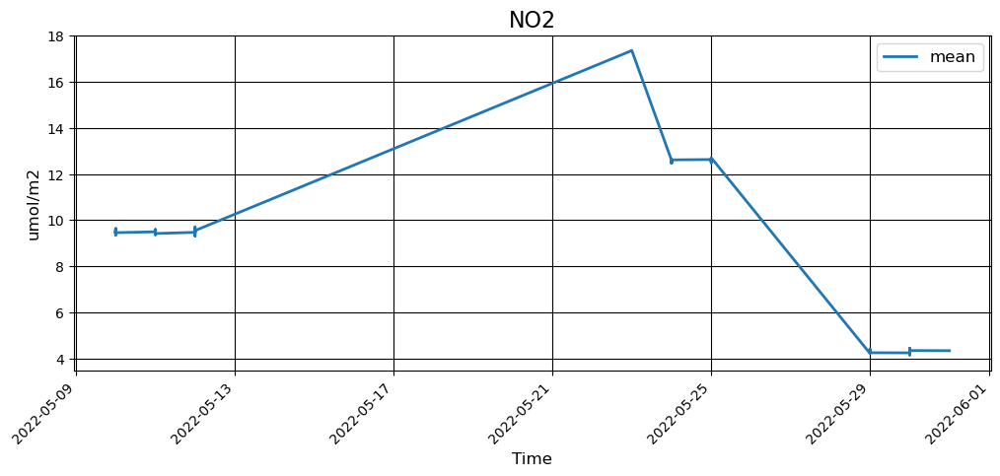

In [267]:
plotting.timeseries_plot([(pwwb_NO2_mean['mean'], 'mean')], 'Time', units['NO2'], 'NO2')

### PM 2.5 Temporal Mean 

url
 https://ideas-digitaltwin.jpl.nasa.gov/nexus//timeAvgMapSpark?ds=PWWB-preds-40x40-hourly-LA_County-PM25&b=-120,32,-117,35&startTime=2022-05-10T00:00:00Z&endTime=2022-05-31T00:00:00Z

Waiting for response from IDEAS... took 1.7442569400009234 seconds


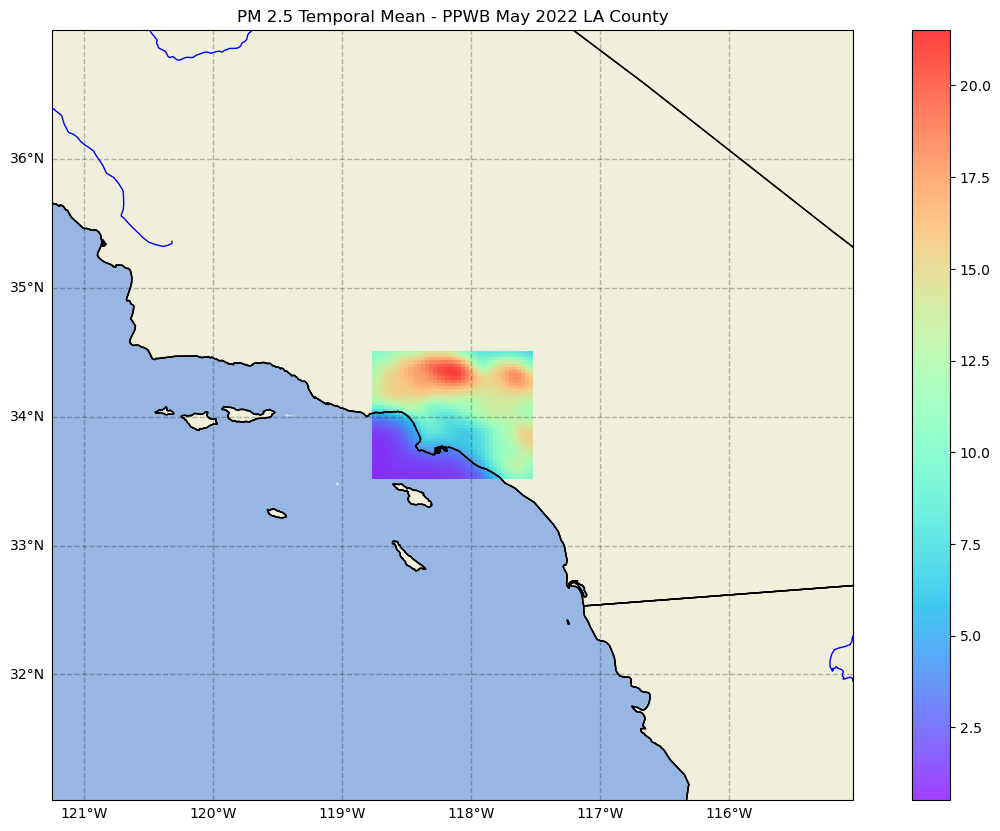

In [268]:
pwwb_PM25_temporal_mean_data = firealarm_processing.temporal_mean(NEXUS_URL, pwwb_PM25, la_ports_bb, pwwb_start_time, pwwb_end_time)
plotting.map_data(pwwb_PM25_temporal_mean_data, "PM 2.5 Temporal Mean - PPWB May 2022 LA County")

### NO2 Temporal Mean 

url
 https://ideas-digitaltwin.jpl.nasa.gov/nexus//timeAvgMapSpark?ds=PWWB-preds-40x40-hourly-LA_County-NO2&b=-120,32,-117,35&startTime=2022-05-10T00:00:00Z&endTime=2022-05-31T00:00:00Z

Waiting for response from IDEAS... took 1.8285951770085376 seconds


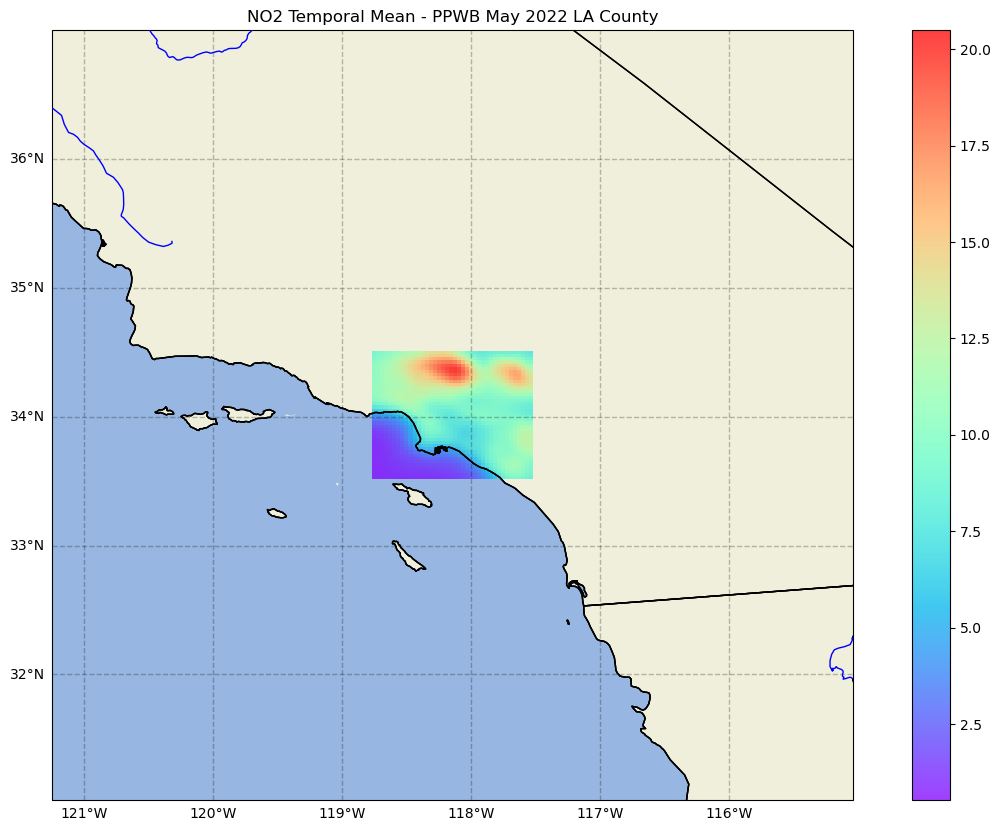

In [269]:
pwwb_NO2_temporal_mean_data = firealarm_processing.temporal_mean(NEXUS_URL, pwwb_NO2, la_ports_bb, pwwb_start_time, pwwb_end_time)
plotting.map_data(pwwb_NO2_temporal_mean_data, "NO2 Temporal Mean - PPWB May 2022 LA County")

### PM 2.5 Temporal Variance

url
 https://ideas-digitaltwin.jpl.nasa.gov/nexus//varianceSpark?ds=PWWB-preds-40x40-hourly-LA_County-PM25&minLon=-120&minLat=32&maxLon=-117&maxLat=35&startTime=2022-05-10T00:00:00Z&endTime=2022-05-31T00:00:00Z

Waiting for response from IDEAS... took 1.9053254039899912 seconds


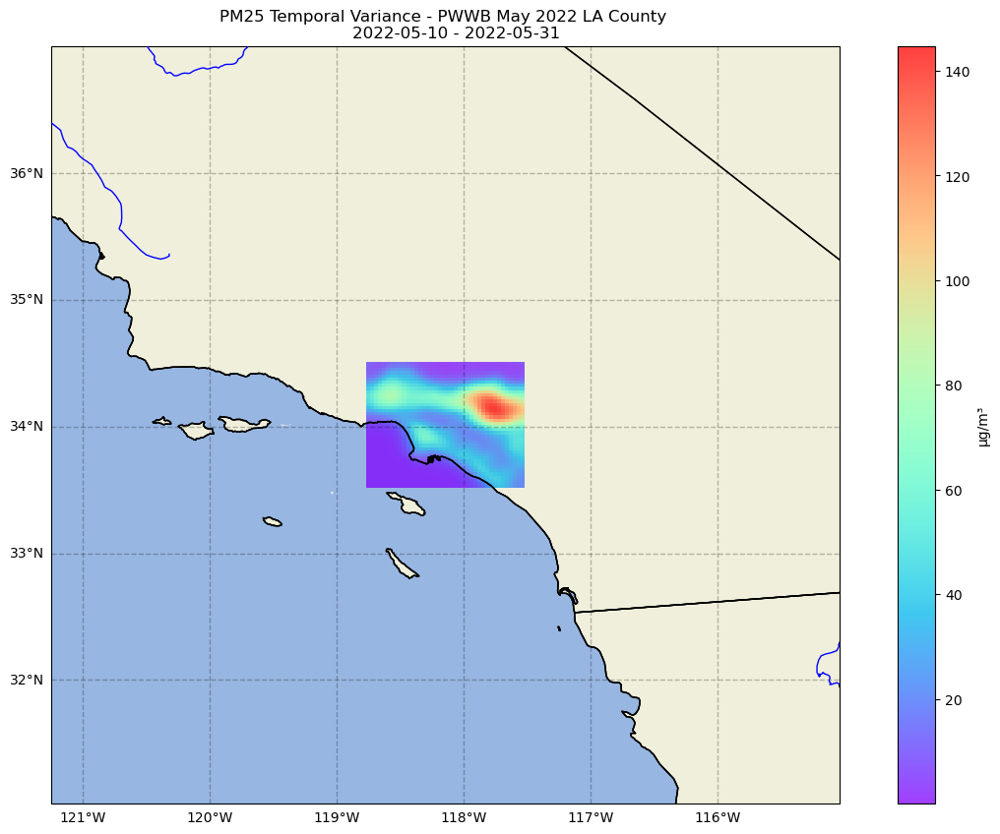

In [270]:
pwwb_temp_var_pm25 = firealarm_processing.temporal_variance(NEXUS_URL, pwwb_PM25, la_ports_bb, pwwb_start_time, pwwb_end_time)
pwwb_variance_title = f'PM25 Temporal Variance - PWWB May 2022 LA County \n\
    {str(pwwb_start_time)[:10]} - {str(pwwb_end_time)[:10]}'
plotting.map_data(pwwb_temp_var_pm25, pwwb_variance_title, cb_label=units['pm25'])

### NO2 Temporal Variance

url
 https://ideas-digitaltwin.jpl.nasa.gov/nexus//varianceSpark?ds=PWWB-preds-40x40-hourly-LA_County-NO2&minLon=-120&minLat=32&maxLon=-117&maxLat=35&startTime=2022-05-10T00:00:00Z&endTime=2022-05-31T00:00:00Z

Waiting for response from IDEAS... took 1.8315404730092268 seconds


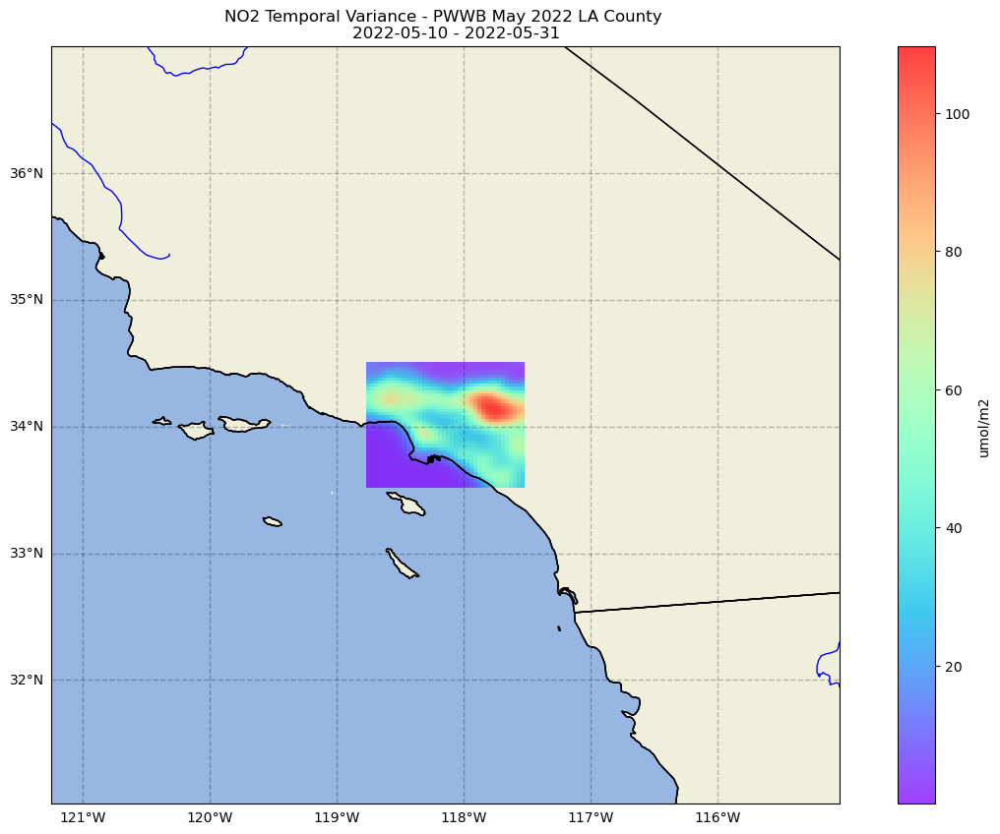

In [271]:
pwwb_temp_var_NO2 = firealarm_processing.temporal_variance(NEXUS_URL, pwwb_NO2, la_ports_bb, pwwb_start_time, pwwb_end_time)
pwwb_variance_title = f'NO2 Temporal Variance - PWWB May 2022 LA County \n\
    {str(pwwb_start_time)[:10]} - {str(pwwb_end_time)[:10]}'
plotting.map_data(pwwb_temp_var_NO2, pwwb_variance_title, cb_label=units['NO2'])

# Air Pollution in the Yellow Sea

The Yellow Sea is a marginal sea of the Western Pacific Ocean located between mainland China and the Korean Peninsula. It is considered among the most degraded marine areas on earth. Loss of natural coastal habitats due to land reclamation has resulted in the destruction of more than 60% of tidal wetlands around the Yellow Sea. 

Every year, China invokes sustainability to unilaterally impose a ban on fishing in the Yellow Sea, Bohai Sea, East China Sea, and the waters north of 12 degrees latitude in the South China Sea. This ban is in effect from May 1 to August 16 and is enforced by the Chinese Coast Guard.

China is one of the largest maritime states and has the largest fishery catch in the world. The large number of fishing vessels in the Yellow Sea has increased the air pollution. 

Pollution also tends to increase in the winter as an increased amount of fuel is burned.  Furthermore dense cold air traps pollutants near the surface of the earth which increases air pollution levels.

Relevant Articles:
- http://english.www.gov.cn/news/topnews/202205/02/content_WS626f2b06c6d02e533532a2a1.html 

### Area of Interest

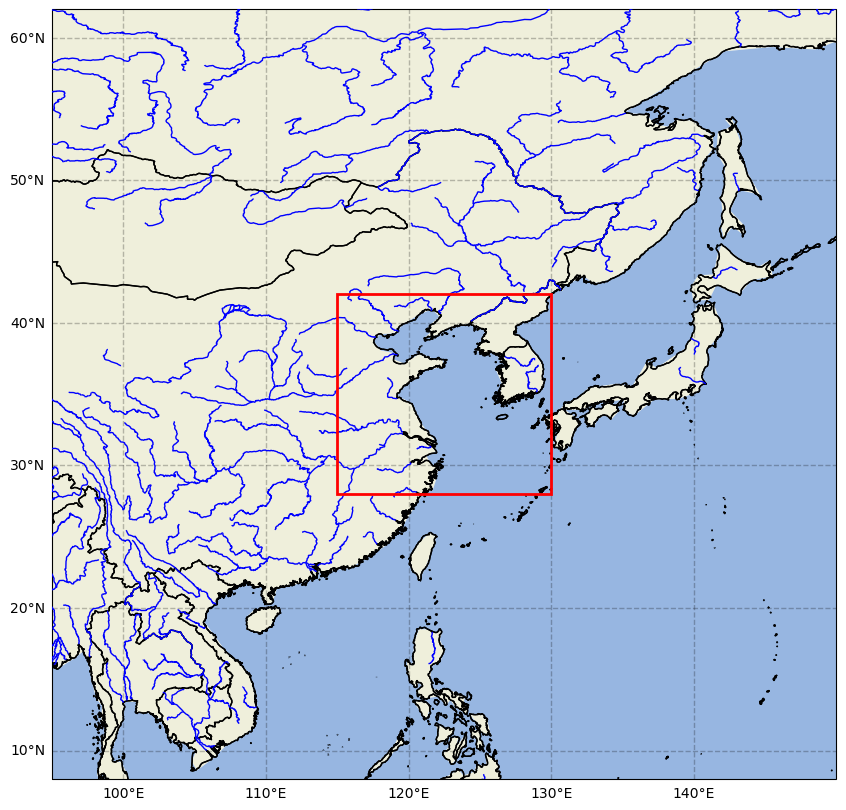

In [272]:
yellow_sea_bb = {'min_lon': 28, 'max_lon': 130, 'min_lat': 8, 'max_lat': 30}
yellow_sea_start_time = datetime(2020, 1, 1)
yellow_sea_end_time = datetime(2020, 12, 1)

yellow_sea_bb = {'min_lon': 115, 'max_lon': 130, 'min_lat': 28, 'max_lat': 42}
plotting.map_box(yellow_sea_bb)

### Air Quality: May vs. February in the Yellow Sea 

The below graphs are a visualization of Aerosol Optical Depth (AOD) data. Aerosol Optical Depth is the measure of aerosols (e.g., urban haze, smoke. particles, desert dust) distributed within a column of air. 


### Generate Legend

In [273]:
wmsUrl = 'https://gibs.earthdata.nasa.gov/wms/epsg4326/best/wms.cgi?\
SERVICE=WMS&REQUEST=GetCapabilities'

response = requests.get(wmsUrl)
WmsTree = xmlet.fromstring(response.content)

legendImg = None
for child in WmsTree.iter():
    for layer in child.findall("./{http://www.opengis.net/wms}Capability/{http://www.opengis.net/wms}Layer//*/"): 
         if layer.tag == '{http://www.opengis.net/wms}Layer': 
            f = layer.find("{http://www.opengis.net/wms}Name")
            if f is not None:
                if f.text == "MODIS_Combined_Value_Added_AOD":
                    # Style
                    e = layer.find(("{http://www.opengis.net/wms}Style/" +
                                    "{http://www.opengis.net/wms}LegendURL/" +
                                    "{http://www.opengis.net/wms}OnlineResource"))
                    legendURL = e.attrib["{http://www.w3.org/1999/xlink}href"]
                    combinedLegendImg = Image(url=legendURL)
                    
#display(combinedLegendImg)

### May (Summer & Fishing Moratorium)

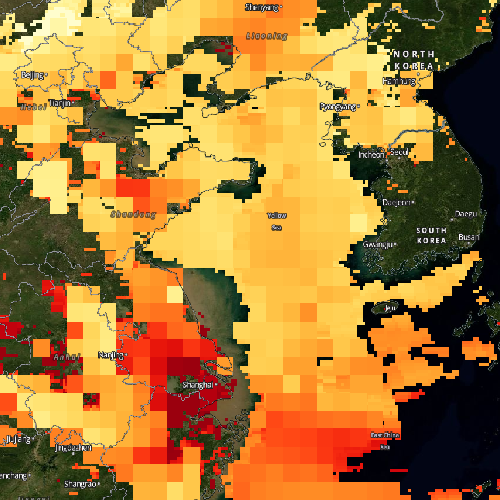

In [274]:
# Connect to GIBS WMS Service
wms = WebMapService('https://gibs.earthdata.nasa.gov/wms/epsg4326/best/wms.cgi?', version='1.3.0')

img = wms.getmap(layers=['BlueMarble_NextGeneration',
                         'MODIS_Terra_Aerosol', 
                         'MODIS_Aqua_Aerosol', 
                         'MODIS_Combined_Value_Added_AOD',
                         'Reference_Features',
                         'Reference_Labels'],  # Layers
                 srs='epsg:4326',  # Map projection
                 bbox=(115, 28, 130, 42),  # Bounds (min-lon, min-lat, max-lon, max-lat) -> min lon: 115.179845, min lat: 28.087158,130.209142,41.718570
                 size=(500, 500),  # Image size
                 time='2021-05-02',  # Time of data
                 format='image/png',  # Image format
                 transparent=True)  # Nodata transparency

# View image and legend
display(combinedLegendImg)
Image(img.read())

### February (Winter & Fishing Season)

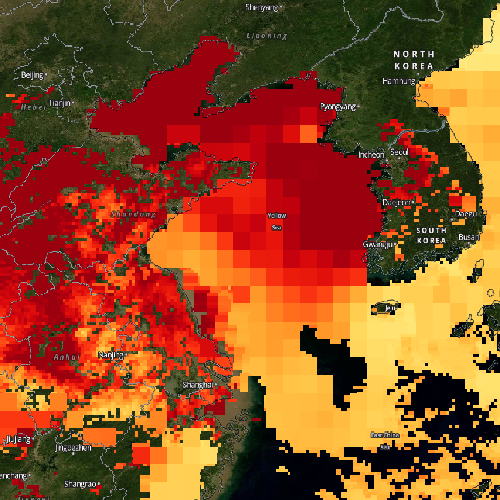

In [275]:
# Connect to GIBS WMS Service
wms = WebMapService('https://gibs.earthdata.nasa.gov/wms/epsg4326/best/wms.cgi?', version='1.3.0')

img = wms.getmap(layers=['BlueMarble_NextGeneration',
                         'MODIS_Terra_Aerosol',
                         'MODIS_Aqua_Aerosol', 
                         'MODIS_Combined_Value_Added_AOD',
                         'Reference_Features',
                         'Reference_Labels'],  # Layers
                 srs='epsg:4326',  # Map projection
                 bbox=(115, 28, 130, 42),  # Bounds (min-lon, min-lat, max-lon, max-lat)
                 size=(500, 500),  # Image size
                 time='2022-02-25',  # Time of data
                 format='image/png',  # Image format
                 transparent=True)  # Nodata transparency

# View image and legend
display(combinedLegendImg)
Image(img.read())

### NO2 Levels

#### NO2 Spatial Mean

url
 https://ideas-digitaltwin.jpl.nasa.gov/nexus//timeSeriesSpark?ds=GMU-OMI-0.25deg-monthly-Global-NO2&minLon=115&minLat=28&maxLon=130&maxLat=42&startTime=2020-01-01T00:00:00Z&endTime=2020-12-01T00:00:00Z&lowPassFilter=False

Waiting for response from IDEAS...took 8.006354503013426 seconds


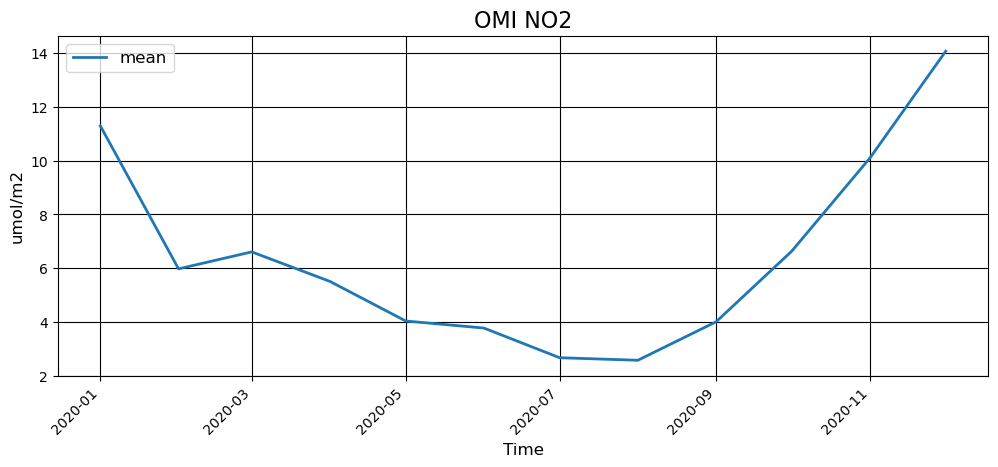

In [276]:
yellow_sea_omi_no2 = firealarm_processing.spatial_timeseries(NEXUS_URL, 'GMU-OMI-0.25deg-monthly-Global-NO2', yellow_sea_bb, yellow_sea_start_time, yellow_sea_end_time)
plotting.timeseries_plot([(yellow_sea_omi_no2['mean'], 'mean')], 'Time', units['NO2'], 'OMI NO2')

# 2022 Fire Season in Southeast Asia
Fire season typically runs from February to April each year and is characterized by high temperatures, dry weather, and widespread agricultural burning.  

Relevant Articles:
- https://earthobservatory.nasa.gov/images/91771/its-fire-season-in-southeast-asia

### Area of Interest

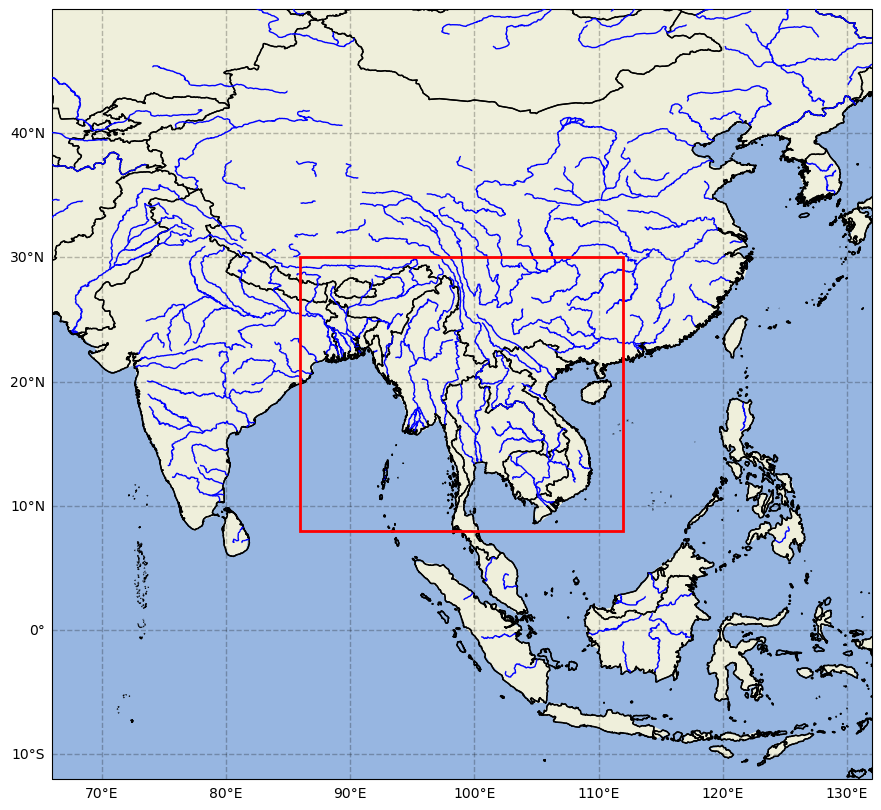

In [277]:
anomalies_start_time = datetime(2022, 2, 1)
anomalies_end_time = datetime(2022, 4, 30)
GMU_NO2_dataset = 'GMU-OMI-0.25deg-monthly-Global-NO2'
GMU_O3_dataset = 'GMU-OMI-0.25deg-monthly-Global-O3'

anomalies_bb = {'min_lon': 86, 'max_lon': 112, 'min_lat': 8, 'max_lat': 30}
plotting.map_box(anomalies_bb)

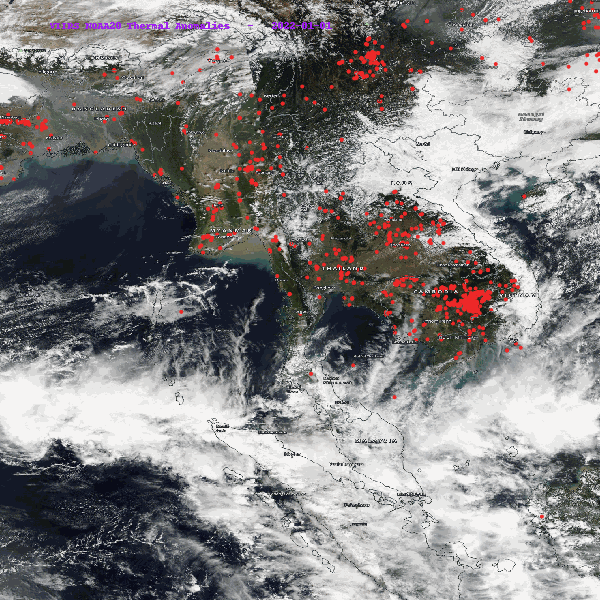

In [278]:
# Note: takes ~20s to generate
wms = WebMapService('https://gibs.earthdata.nasa.gov/wms/epsg4326/best/wms.cgi?', version='1.3.0')

layers=['VIIRS_NOAA20_CorrectedReflectance_TrueColor', 
        'VIIRS_NOAA20_Thermal_Anomalies_375m_All',
        'Reference_Features',
        'Reference_Labels']
color = 'rgb(160, 32, 240)'
frames = []

sdate = datetime(2022, 1, 1)
edate = datetime(2022, 4, 1)
dates = pd.date_range(sdate,edate,freq='MS') 

for day in dates:
    datatime = day.strftime("%Y-%m-%d")
    img = wms.getmap(layers=layers,  # Layers
                     srs='epsg:4326',  # Map projection
                     bbox=(86, -5, 112, 31), # Bounds
                     size=(600,600),  # Image size
                     time=datatime,  # Time of data
                     format='image/png',  # Image format
                     transparent=True)  # Nodata transparency

    image = I.open(img)
    draw = ImageDraw.Draw(image)
    (x, y) = (50, 20)
    draw.text((x, y), f'VIIRS NOAA20 Thermal Anomalies   -   {datatime}', fill=color)
    frames.append(image)
    
frames[0].save('VIIRS_NOAA20_Thermal_Anomalies_375m_All.gif',
               format='GIF',
               append_images=frames,
               save_all=True,
               duration=1000,
               loop=0)

Image('VIIRS_NOAA20_Thermal_Anomalies_375m_All.gif')

### NO2 Levels

#### NO2 Spatial Mean

url
 https://ideas-digitaltwin.jpl.nasa.gov/nexus//timeSeriesSpark?ds=GMU-OMI-0.25deg-monthly-Global-NO2&minLon=86&minLat=8&maxLon=112&maxLat=30&startTime=2022-01-01T00:00:00Z&endTime=2022-09-01T00:00:00Z&lowPassFilter=False

Waiting for response from IDEAS...took 1.6286667690146714 seconds


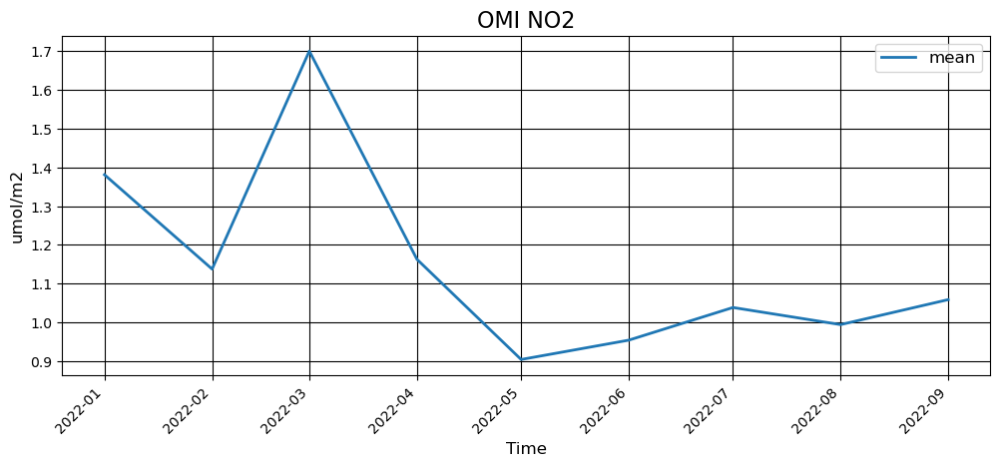

In [279]:
anomalies_NO2 = firealarm_processing.spatial_timeseries(NEXUS_URL, GMU_NO2_dataset, anomalies_bb, datetime(2022, 1, 1), datetime(2022, 9, 1))
plotting.timeseries_plot([(anomalies_NO2['mean'], 'mean')], 'Time', units['NO2'], 'OMI NO2')

#### NO2 Temporal Mean

url
 https://ideas-digitaltwin.jpl.nasa.gov/nexus//timeAvgMapSpark?ds=GMU-OMI-0.25deg-monthly-Global-NO2&b=86,8,112,30&startTime=2022-02-01T00:00:00Z&endTime=2022-04-30T00:00:00Z

Waiting for response from IDEAS... took 3.353575977991568 seconds


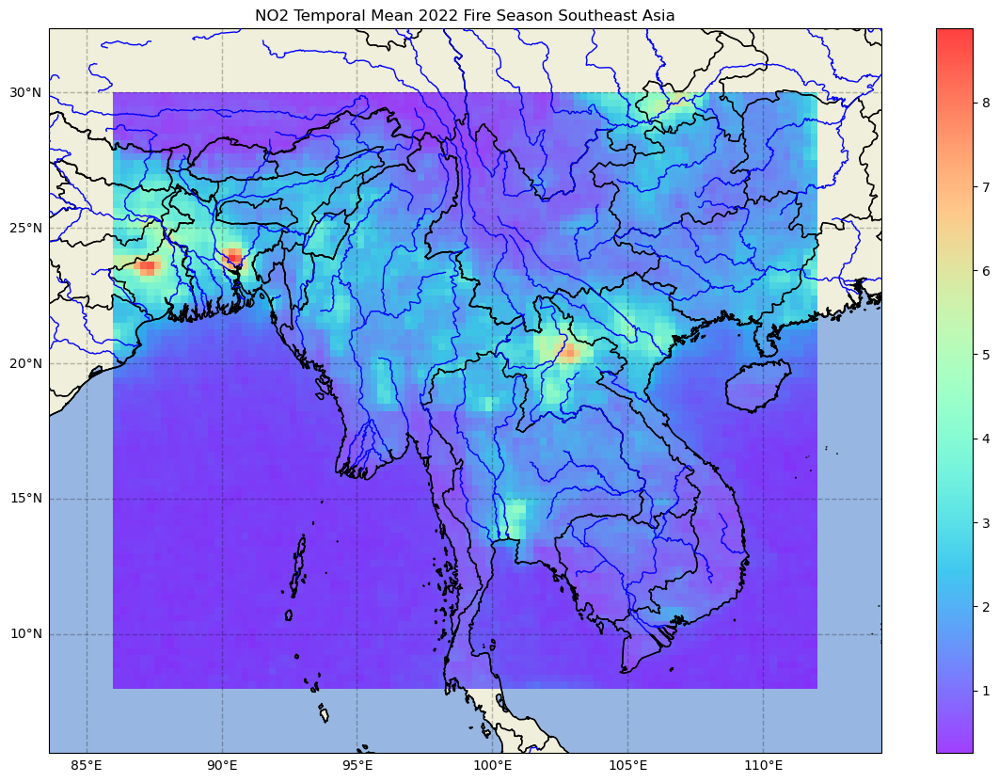

In [280]:
NO2_temporal_mean_data = firealarm_processing.temporal_mean(NEXUS_URL, GMU_NO2_dataset, anomalies_bb, anomalies_start_time, anomalies_end_time)
plotting.map_data(NO2_temporal_mean_data, "NO2 Temporal Mean 2022 Fire Season Southeast Asia")

### O3 Levels

#### O3 Spatial Mean

url
 https://ideas-digitaltwin.jpl.nasa.gov/nexus//timeSeriesSpark?ds=GMU-OMI-0.25deg-monthly-Global-O3&minLon=86&minLat=8&maxLon=112&maxLat=30&startTime=2022-01-01T00:00:00Z&endTime=2022-09-01T00:00:00Z&lowPassFilter=False

Waiting for response from IDEAS...took 1.211212402995443 seconds


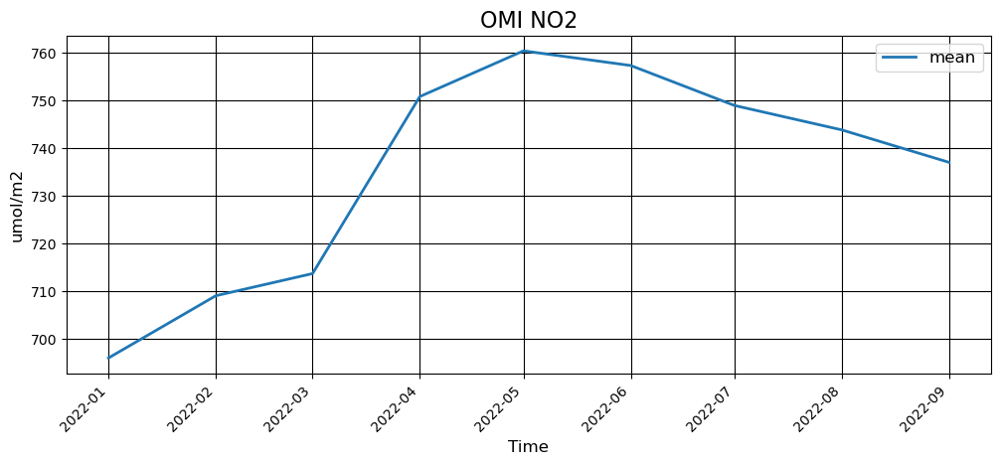

In [281]:
anomalies_O3 = firealarm_processing.spatial_timeseries(NEXUS_URL, GMU_O3_dataset, anomalies_bb, datetime(2022, 1, 1), datetime(2022, 9, 1))
plotting.timeseries_plot([(anomalies_O3['mean'], 'mean')], 'Time', units['NO2'], 'OMI NO2')

#### O3 Temporal Mean

url
 https://ideas-digitaltwin.jpl.nasa.gov/nexus//timeAvgMapSpark?ds=GMU-OMI-0.25deg-monthly-Global-O3&b=86,8,112,30&startTime=2022-02-01T00:00:00Z&endTime=2022-04-30T00:00:00Z

Waiting for response from IDEAS... took 2.120802002988057 seconds


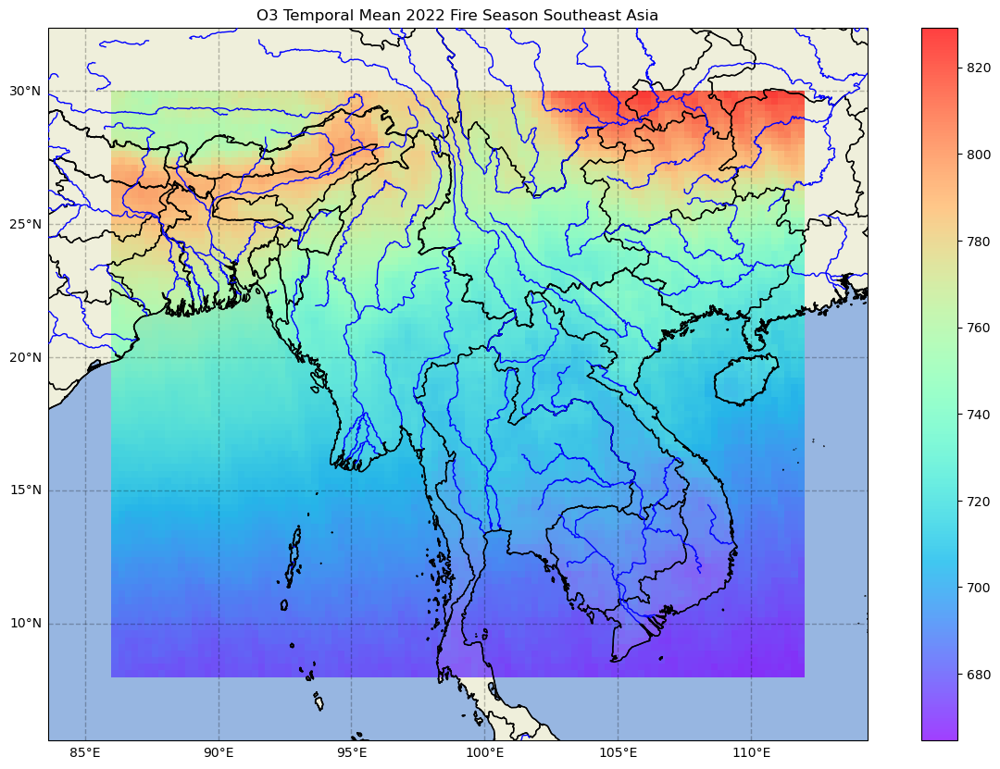

In [282]:
O3_temporal_mean_data = firealarm_processing.temporal_mean(NEXUS_URL, GMU_O3_dataset, anomalies_bb, anomalies_start_time, anomalies_end_time)
plotting.map_data(O3_temporal_mean_data, "O3 Temporal Mean 2022 Fire Season Southeast Asia")